In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [2]:
file_path = "Loan 2.csv"
data = pd.read_csv(file_path)

In [12]:
data

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),...,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.05,Low,Working,Sales staff,Semi-Urban,72809.58,...,809.44,0,NaN,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.91,Low,Working,NaN,Semi-Urban,46837.47,...,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.19,High,Pensioner,NaN,Semi-Urban,45593.04,...,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,NaN,High,Pensioner,NaN,Rural,80057.92,...,832.70,1,Unpossessed,890,NaN,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.77,Low,Working,High skill tech staff,Semi-Urban,113858.89,...,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,C-43723,Angelyn Clevenger,M,38,4969.41,Low,Commercial associate,Managers,Urban,76657.90,...,869.61,0,Unpossessed,566,4969.41,4,Urban,1,111096.56,68992.11
29996,C-32511,Silas Slaugh,M,20,1606.88,Low,Working,Laborers,Semi-Urban,66595.14,...,729.41,0,Inactive,175,1606.88,3,Urban,1,73453.94,46616.60
29997,C-5192,Carmelo Lone,F,49,NaN,Low,Working,Sales staff,Urban,81410.08,...,NaN,0,Active,959,NaN,1,Rural,1,102108.02,61057.56
29998,C-12172,Carolann Osby,M,38,2417.71,Low,Working,Security staff,Semi-Urban,142524.10,...,677.27,1,Unpossessed,375,2417.71,4,Urban,1,168194.47,99766.87


## Studying The Data

1. Understand the structure of the data

In [13]:
print("Data Structure:")
print(data.info())

print("\nFirst few rows of the dataset:")
print(data.head())

print("\nSummary statistics:")
print(data.describe())

Data Structure:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 24 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Customer ID                  30000 non-null  object 
 1   Name                         30000 non-null  object 
 2   Gender                       29947 non-null  object 
 3   Age                          30000 non-null  int64  
 4   Income (USD)                 25424 non-null  float64
 5   Income Stability             28317 non-null  object 
 6   Profession                   30000 non-null  object 
 7   Type of Employment           22730 non-null  object 
 8   Location                     30000 non-null  object 
 9   Loan Amount Request (USD)    30000 non-null  float64
 10  Current Loan Expenses (USD)  29828 non-null  float64
 11  Expense Type 1               30000 non-null  object 
 12  Expense Type 2               30000 non-null  object 
 13  

2. Identify missing values

In [14]:
print("\nMissing values per column:")
print(data.isnull().sum())


Missing values per column:
Customer ID                       0
Name                              0
Gender                           53
Age                               0
Income (USD)                   4576
Income Stability               1683
Profession                        0
Type of Employment             7270
Location                          0
Loan Amount Request (USD)         0
Current Loan Expenses (USD)     172
Expense Type 1                    0
Expense Type 2                    0
Dependents                     2493
Credit Score                   1703
No. of Defaults                   0
Has Active Credit Card         1566
Property ID                       0
Property Age                   4850
Property Type                     0
Property Location               356
Co-Applicant                      0
Property Price                    0
Loan Sanction Amount (USD)      340
dtype: int64


3. Basic data exploration

###### Distribution of numerical features

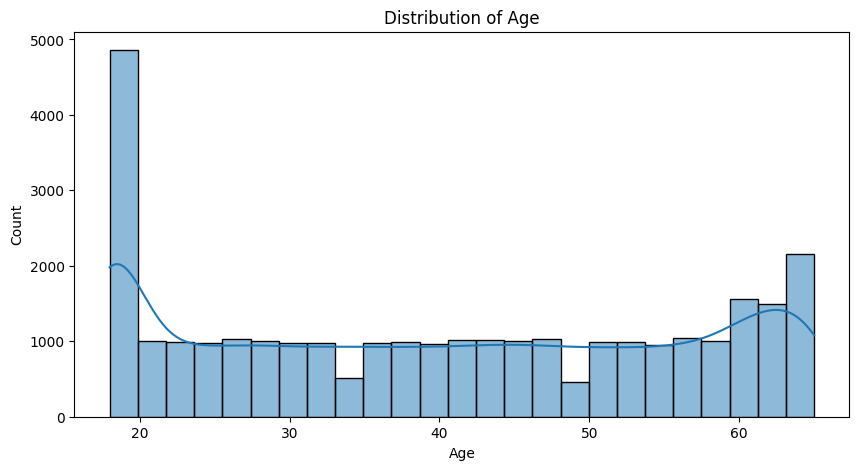

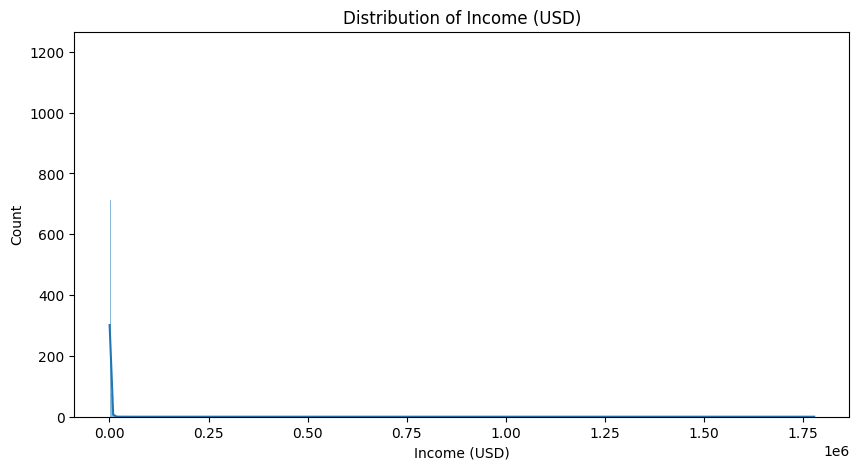

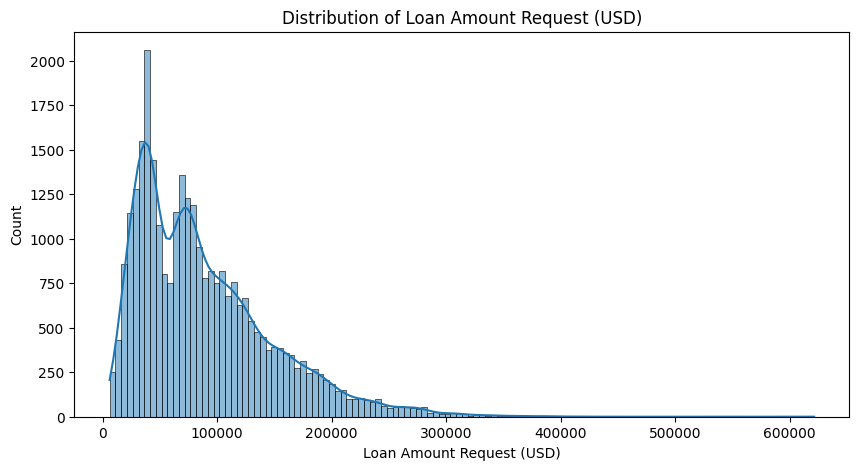

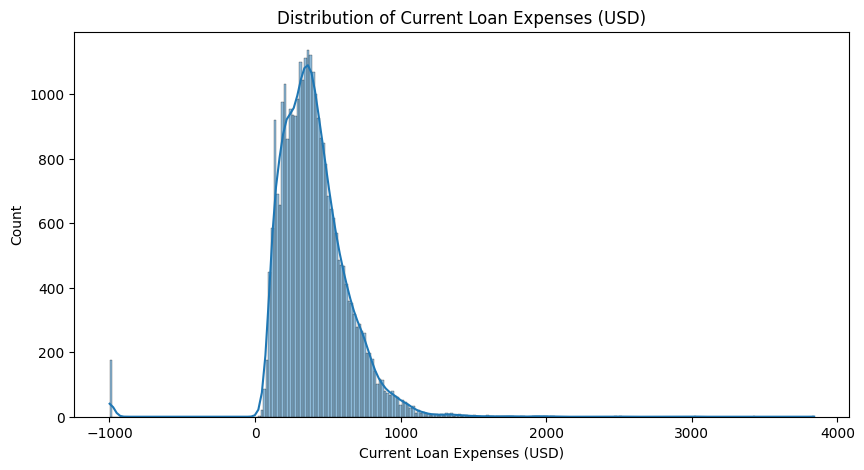

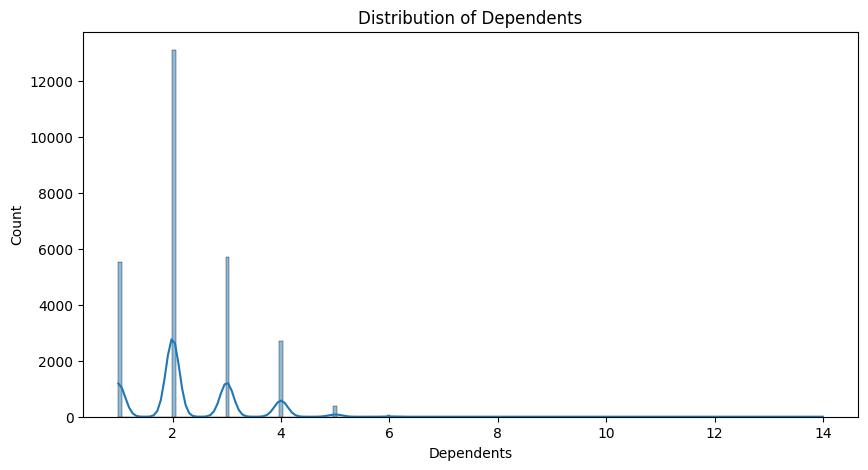

...

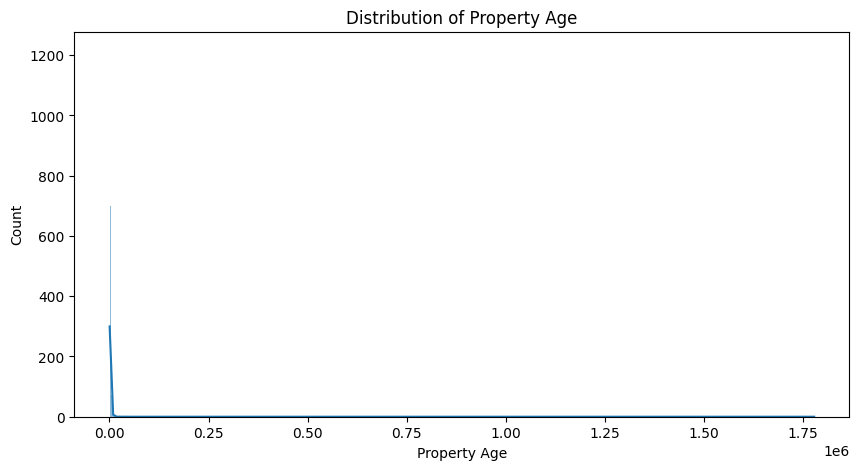

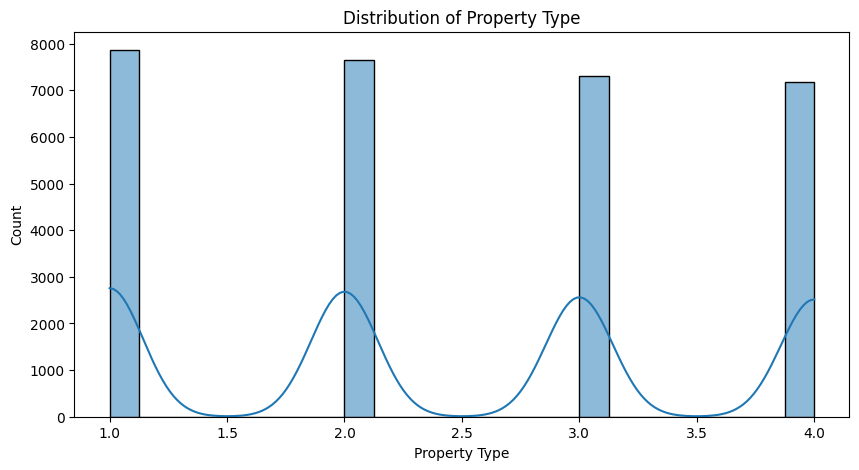

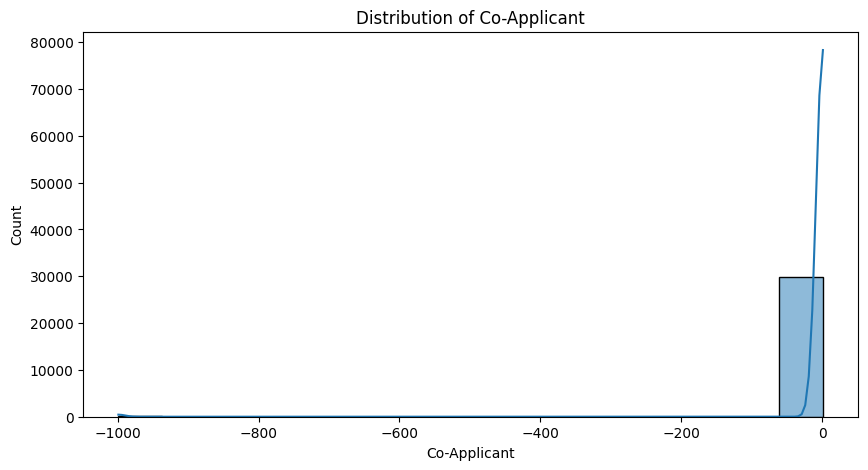

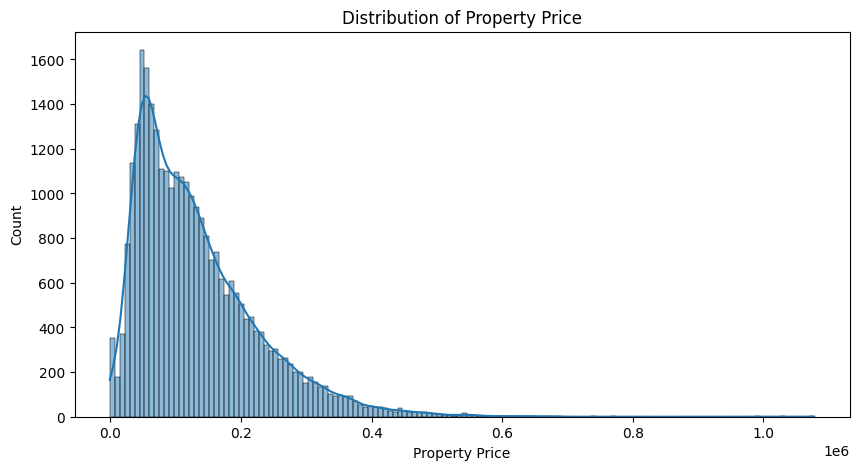

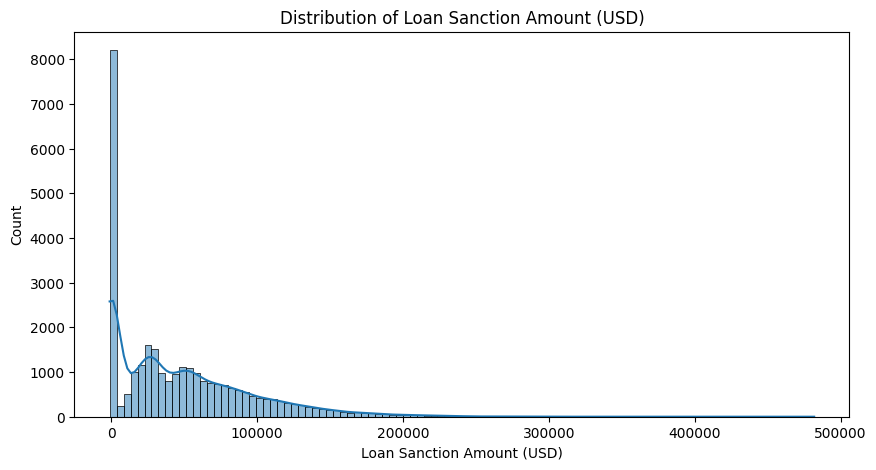

In [15]:
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()



###### Correlation Heatmap


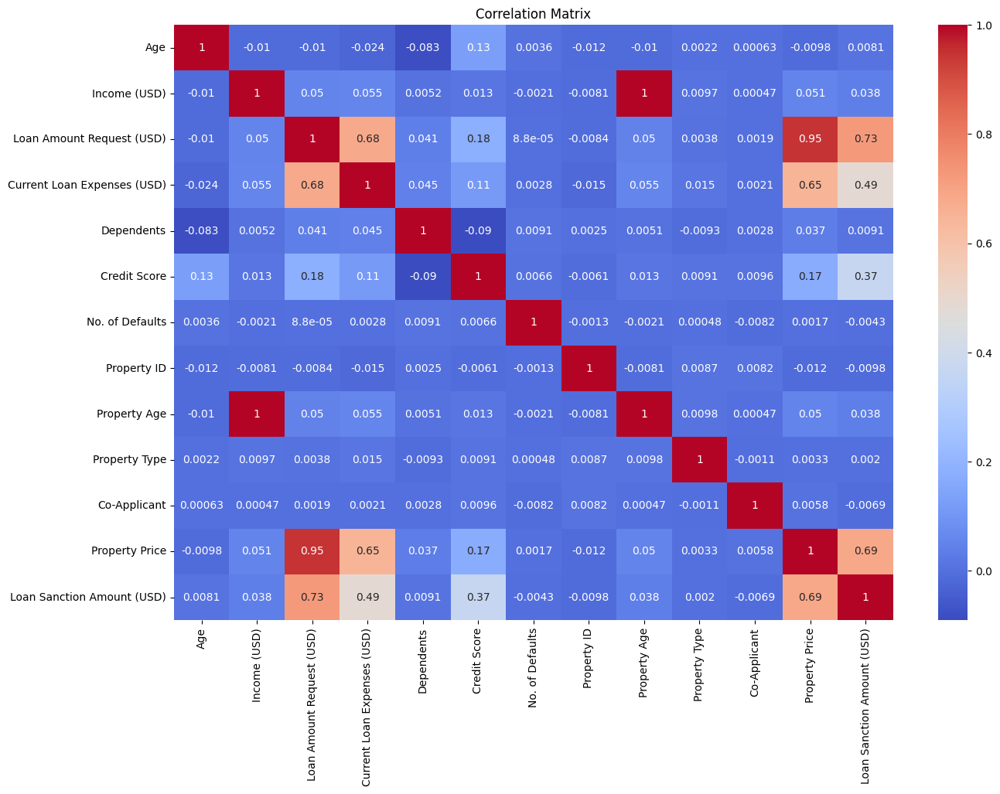

In [16]:
# Correlation heatmap
plt.figure(figsize=(15, 10))
# Use only numerical columns for correlation matrix
numerical_data = data[numerical_cols]
correlation_matrix = numerical_data.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

###### Pairplot to understand relationships between numerical variables


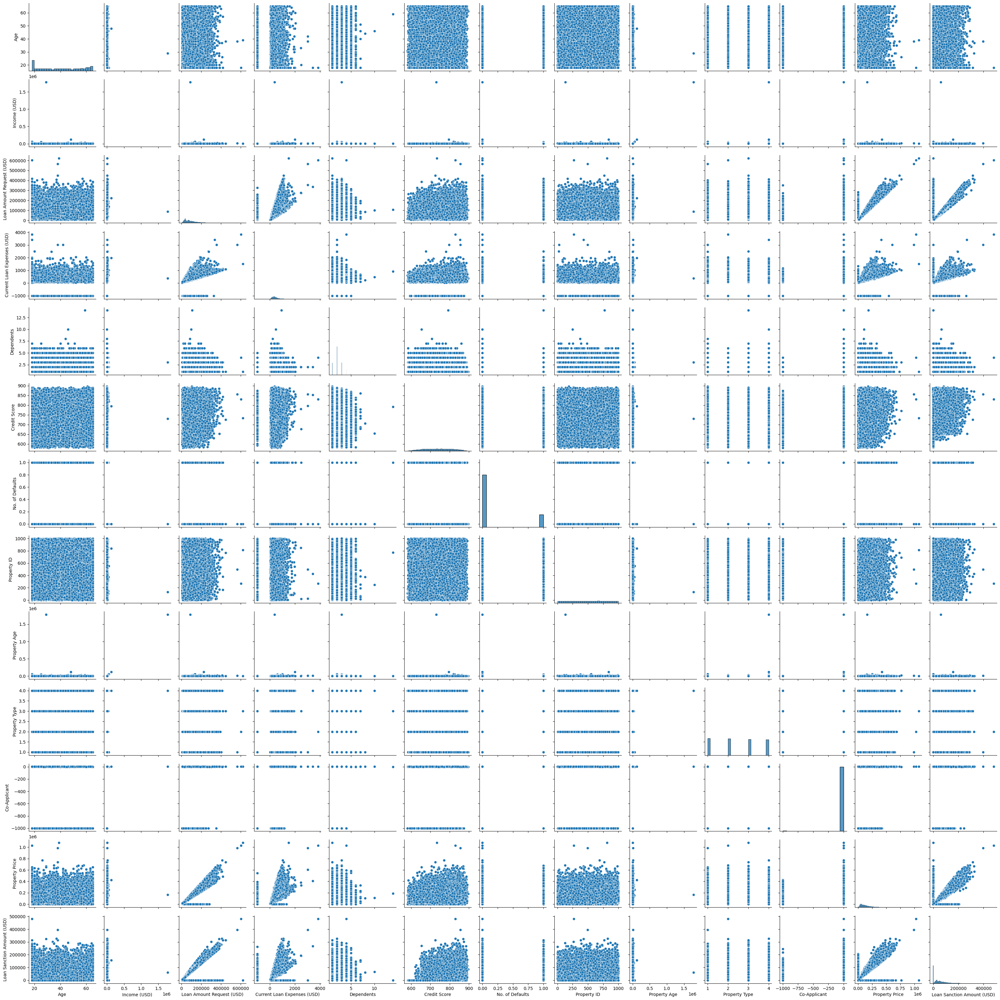

In [17]:
# Pairplot to understand relationships between numerical variables
sns.pairplot(numerical_data)
plt.show()

## Cleaning The Data

In [18]:
# 1. Identify column types
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = data.select_dtypes(include=['object']).columns

# To decide appropriate methods, let's examine the missing values
missing_values = data.isnull().sum()
print("Missing values per column:")
print(missing_values)

# 2. Apply appropriate imputation techniques

# Fill numerical columns with mean or median
numerical_fill_mean = ['Age', 'Income (USD)', 'Credit Score', 'Property Price']
numerical_fill_median = ['Loan Amount Request (USD)', 'Loan Sanction Amount (USD)']

for col in numerical_cols:
    if col in numerical_fill_mean:
        data[col].fillna(data[col].mean(), inplace=True)
    elif col in numerical_fill_median:
        data[col].fillna(data[col].median(), inplace=True)
    else:
        data[col].interpolate(method='linear', inplace=True)

# Fill categorical columns with mode
for col in categorical_cols:
    if data[col].nunique() > 1:
        data[col].fillna(data[col].mode()[0], inplace=True)

# Verify the data
print("\nMissing values after cleaning:")
print(data.isnull().sum())

# Save the cleaned data to a new CSV file
data.to_csv('Loan_Cleaned.csv', index=False)

# Display the cleaned data
data.head()


Missing values per column:
Customer ID                       0
Name                              0
Gender                           53
Age                               0
Income (USD)                   4576
Income Stability               1683
Profession                        0
Type of Employment             7270
Location                          0
Loan Amount Request (USD)         0
Current Loan Expenses (USD)     172
Expense Type 1                    0
Expense Type 2                    0
Dependents                     2493
Credit Score                   1703
No. of Defaults                   0
Has Active Credit Card         1566
Property ID                       0
Property Age                   4850
Property Type                     0
Property Location               356
Co-Applicant                      0
Property Price                    0
Loan Sanction Amount (USD)      340
dtype: int64

Missing values after cleaning:
Customer ID                    0
Name                           

C:\Users\mehta\AppData\Local\Temp\ipykernel_2656\2945755357.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mean(), inplace=True)
C:\Users\mehta\AppData\Local\Temp\ipykernel_2656\2945755357.py:20: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exa

,Customer ID,Name,Gender,Age,Income (USD),Income Stability,Profession,Type of Employment,Location,Loan Amount Request (USD),...,Credit Score,No. of Defaults,Has Active Credit Card,Property ID,Property Age,Property Type,Property Location,Co-Applicant,Property Price,Loan Sanction Amount (USD)
0,C-36995,Frederica Shealy,F,56,1933.050000,Low,Working,Sales staff,Semi-Urban,72809.58,...,809.44,0,Active,746,1933.05,4,Rural,1,119933.46,54607.18
1,C-33999,America Calderone,M,32,4952.910000,Low,Working,Laborers,Semi-Urban,46837.47,...,780.40,0,Unpossessed,608,4952.91,2,Rural,1,54791.00,37469.98
2,C-3770,Rosetta Verne,F,65,988.190000,High,Pensioner,Laborers,Semi-Urban,45593.04,...,833.15,0,Unpossessed,546,988.19,2,Urban,0,72440.58,36474.43
3,C-26480,Zoe Chitty,F,65,2630.574417,High,Pensioner,Laborers,Rural,80057.92,...,832.70,1,Unpossessed,890,1801.48,2,Semi-Urban,1,121441.51,56040.54
4,C-23459,Afton Venema,F,31,2614.770000,Low,Working,High skill tech staff,Semi-Urban,113858.89,...,745.55,1,Active,715,2614.77,4,Semi-Urban,1,208567.91,74008.28


## Removing Outliers 

### Lets Visualize First

1. Boxplot

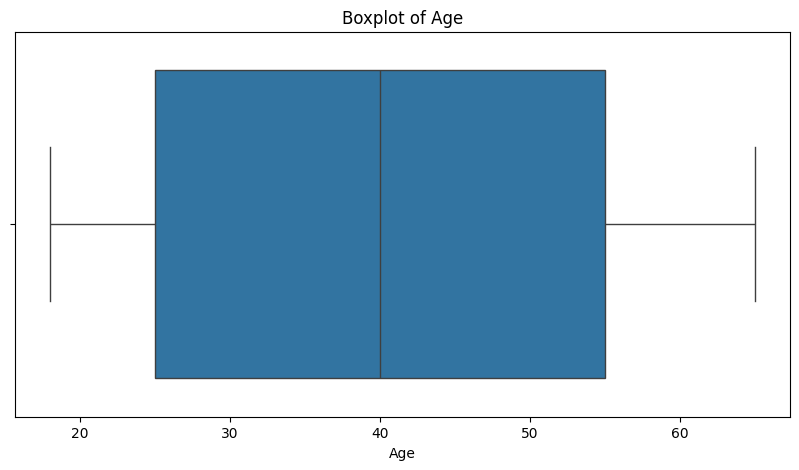

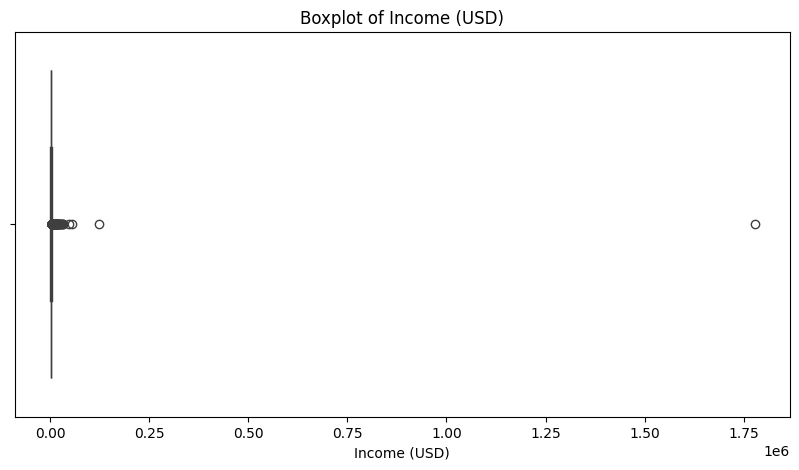

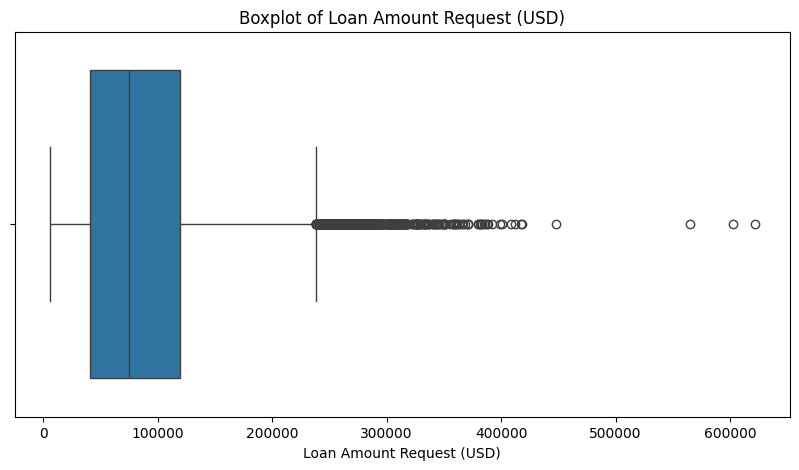

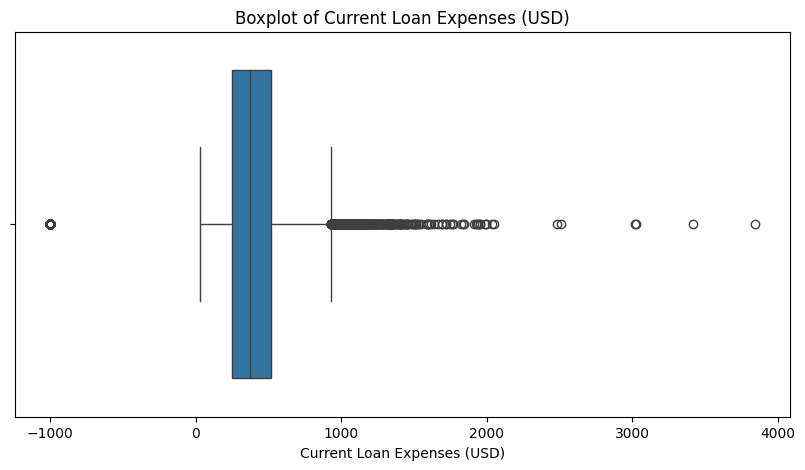

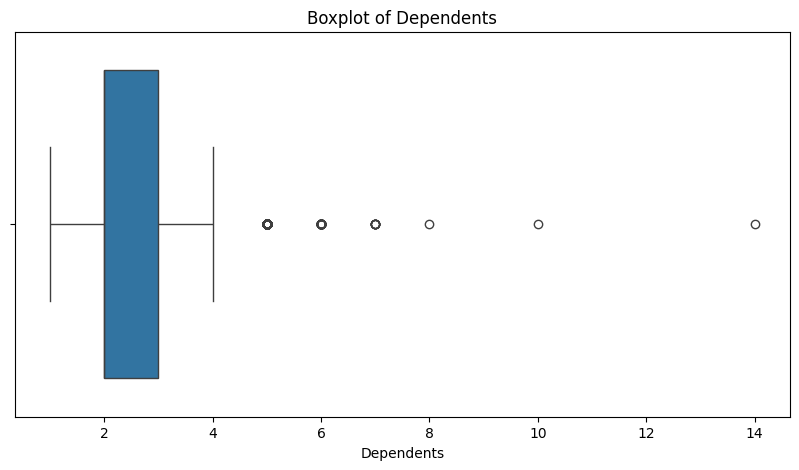

...

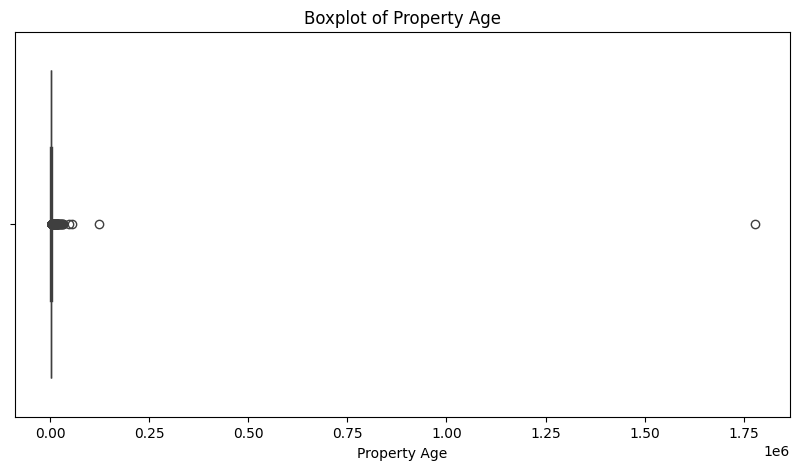

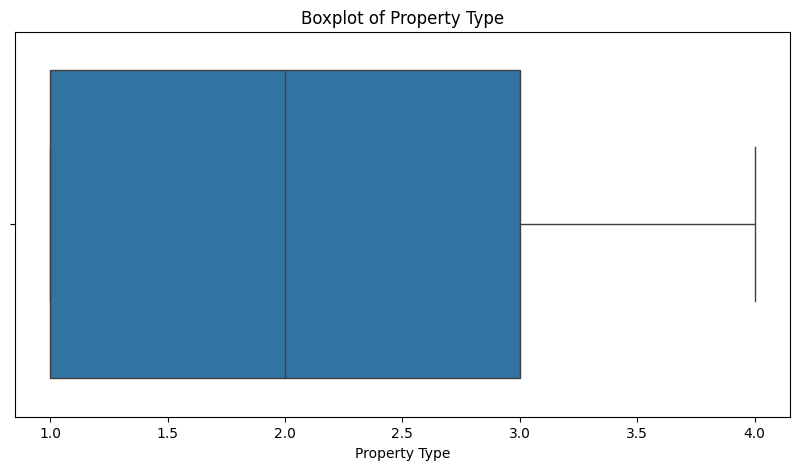

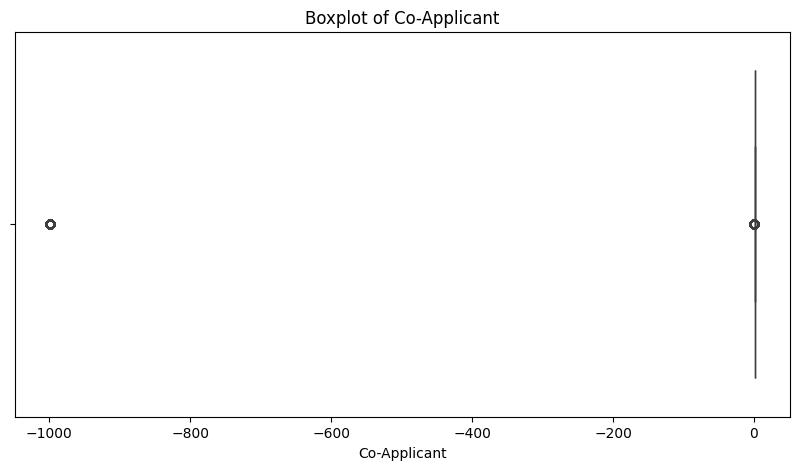

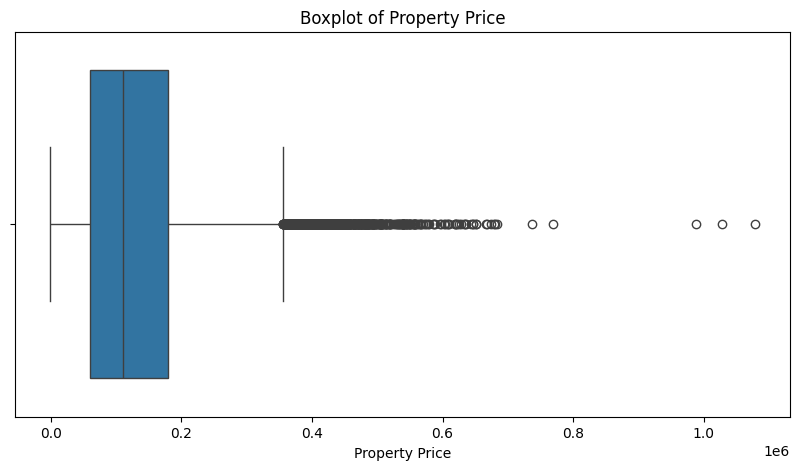

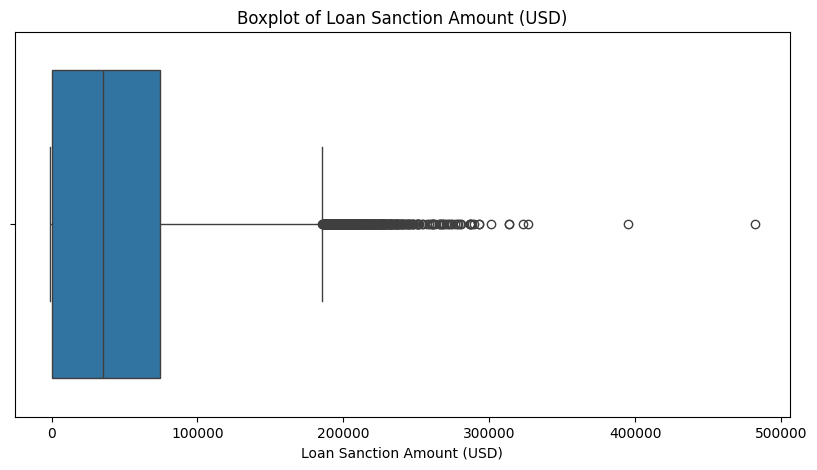

In [31]:
# Create boxplots for numerical columns
for col in data.select_dtypes(include=['float64', 'int64']):
    plt.figure(figsize=(10, 5))
    sns.boxplot(x=data[col])
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()


### Now Lets Handle The Outliers Using the Following Methods

1. Using Z Score

In [3]:
# Function to detect and remove outliers using Z-score
def remove_outliers_zscore(df, threshold=3):
    z_scores = np.abs(stats.zscore(df.select_dtypes(include=['float64', 'int64'])))
    filtered_entries = (z_scores < threshold).all(axis=1)
    return df[filtered_entries]

# Apply the function
data_cleaned_zscore = remove_outliers_zscore(data)
# Save the cleaned data to a new CSV file
data_cleaned_zscore.to_csv('Loan_Cleaned_ZScore.csv', index=False)


2. Using IQR

In [4]:
# Function to detect and remove outliers using IQR
def remove_outliers_iqr(df, factor=1.5):
    filtered_df = df.copy()
    for col in df.select_dtypes(include=['float64', 'int64']):
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR
        filtered_df = filtered_df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return filtered_df

# Apply the function
data_cleaned_iqr = remove_outliers_iqr(data)
# Save the cleaned data to a new CSV file
data_cleaned_iqr.to_csv('Loan_Cleaned_IQR.csv', index=False)


C:\Users\mehta\AppData\Local\Temp\ipykernel_9092\4181256007.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df = filtered_df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
C:\Users\mehta\AppData\Local\Temp\ipykernel_9092\4181256007.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df = filtered_df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
C:\Users\mehta\AppData\Local\Temp\ipykernel_9092\4181256007.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df = filtered_df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
C:\Users\mehta\AppData\Local\Temp\ipykernel_9092\4181256007.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered_df = filtered_df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
C:\Users\mehta\AppData\Local\Temp\ipykernel_9092\4181256007.py:10: UserWarning: Boolean Series key will 

3. Using Winsorization

In [5]:
# Function to apply Winsorization
def winsorize_series(series, lower_percentile=0.05, upper_percentile=0.95):
    lower_limit = series.quantile(lower_percentile)
    upper_limit = series.quantile(upper_percentile)
    return series.clip(lower=lower_limit, upper=upper_limit)

# Apply Winsorization to numerical columns
for col in data.select_dtypes(include=['float64', 'int64']):
    data[col] = winsorize_series(data[col])

# Save the cleaned data to a new CSV file
data.to_csv('Loan_Cleaned_Winsorized.csv', index=False)


4. Replacing Outliers with median based on IQR Method

In [6]:
# Function to replace outliers with median based on IQR method
def impute_outliers_median(df, factor=1.5):
    imputed_df = df.copy()
    for col in df.select_dtypes(include=(['float64', 'int64'])):
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR
        median = df[col].median()
        imputed_df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), median, df[col])
    return imputed_df

# Apply the function
data_cleaned_imputed = impute_outliers_median(data)
# Save the cleaned data to a new CSV file
data_cleaned_imputed.to_csv('Loan_Cleaned_Imputed.csv', index=False)


5. Log Transformation

In [7]:
# Function to apply log transformation to handle outliers
def log_transform(df):
    transformed_df = df.copy()
    for col in df.select_dtypes(include=['float64', 'int64']):
        transformed_df[col] = np.log1p(df[col])  # log1p is log(1 + x) to handle zero values
    return transformed_df

# Apply the function
data_log_transformed = log_transform(data)
# Save the transformed data to a new CSV file
data_log_transformed.to_csv('Loan_Log_Transformed.csv', index=False)


6. Isolation Forest(Machine Learning Based)

In [8]:
from sklearn.ensemble import IsolationForest
file_path = 'Loan_Cleaned.csv'
data = pd.read_csv(file_path)
# Function to apply Isolation Forest to detect and remove outliers
def isolation_forest_outliers(df):
    iso = IsolationForest(contamination=0.1)  # Adjust contamination as needed
    yhat = iso.fit_predict(df.select_dtypes(include=['float64', 'int64']))
    mask = yhat != -1
    return df[mask]

# Apply the function
data_cleaned_isolation_forest = isolation_forest_outliers(data)
# Save the cleaned data to a new CSV file
data_cleaned_isolation_forest.to_csv('Loan_Cleaned_IsolationForest.csv', index=False)


7. DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

In [9]:
from sklearn.cluster import DBSCAN

# Load the dataset
file_path = 'Loan_Cleaned.csv'
data = pd.read_csv(file_path)

# Function to apply DBSCAN to detect and remove outliers
def dbscan_outliers(df):
    dbscan = DBSCAN(eps=3, min_samples=2)  # Adjust eps and min_samples as needed
    yhat = dbscan.fit_predict(df.select_dtypes(include=['float64', 'int64']))
    mask = yhat != -1
    return df[mask]

# Apply the function
data_cleaned_dbscan = dbscan_outliers(data)
# Save the cleaned data to a new CSV file
data_cleaned_dbscan.to_csv('Loan_Cleaned_DBSCAN.csv', index=False)


## Univariate Analysis
#### Univariate analysis involves examining the distribution and characteristics of individual variables.

In [2]:
data = pd.read_csv('loan_cleaned_zscore.csv')

##### Summary Statistics

In [4]:
# Summary statistics for numerical columns
summary_stats = data.describe()
print(summary_stats)

                Age  Income (USD)  Loan Amount Request (USD)  \
count  28851.000000  28851.000000               28851.000000   
mean      40.114797   2517.895261               84431.822172   
std       16.055663   1290.214350               52430.645803   
min       18.000000    377.700000                6048.240000   
25%       25.000000   1726.850000               40720.005000   
50%       40.000000   2448.730000               73827.290000   
75%       55.000000   2812.410000              115984.595000   
max       65.000000  32726.980000              267108.380000   

       Current Loan Expenses (USD)    Dependents  Credit Score  \
count                 28851.000000  28851.000000  28851.000000   
mean                    394.417945      2.243804    739.024282   
std                     191.759788      0.917740     69.995545   
min                    -319.155000      1.000000    580.850000   
25%                     247.120000      2.000000    684.535000   
50%                     371

##### KDE Plot with Rug Plot
###### A KDE plot combined with a rug plot provides a smooth estimate of the distribution of data along with individual data points.

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


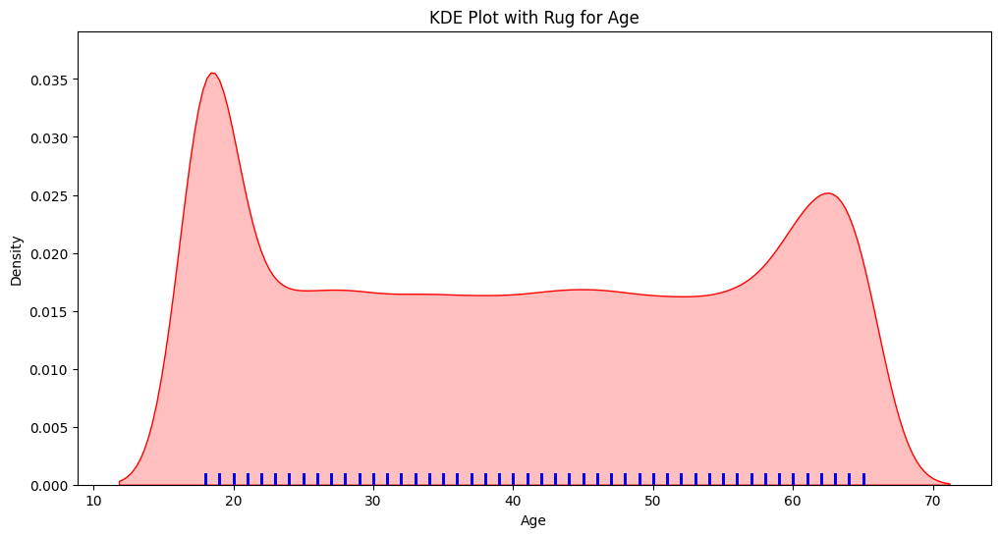

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


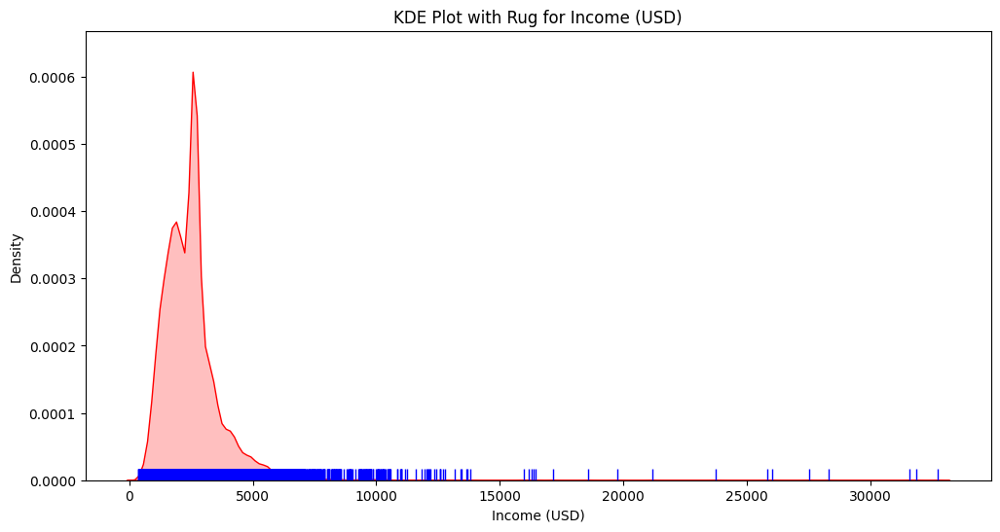

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


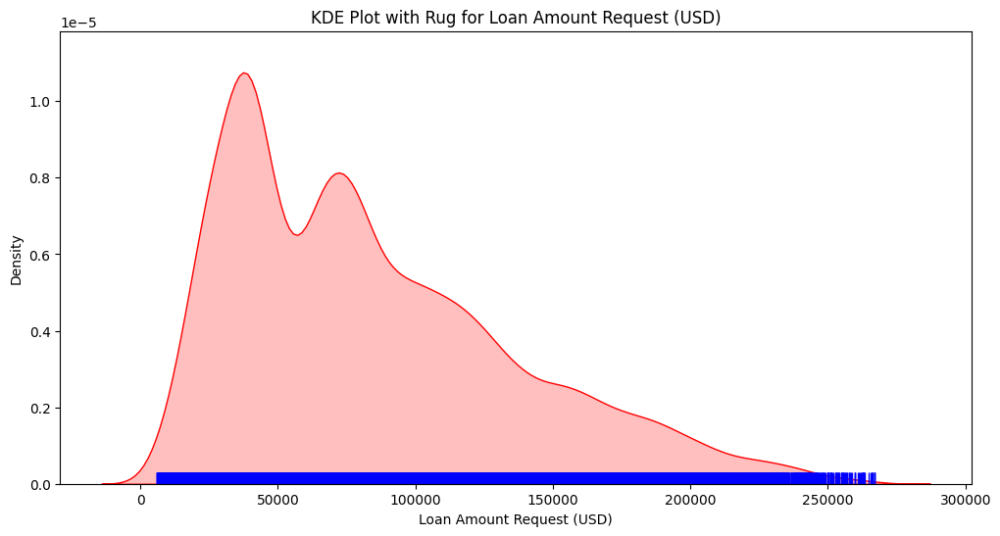

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


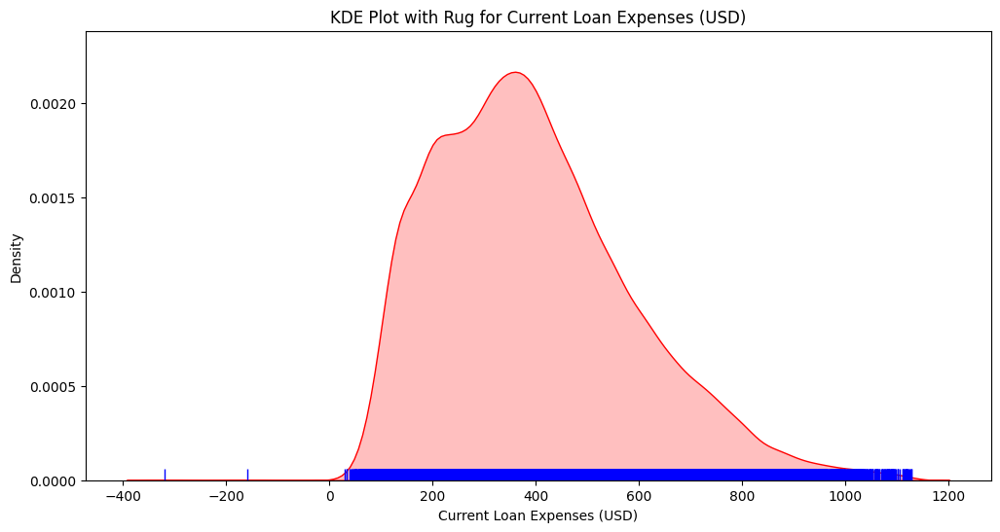

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


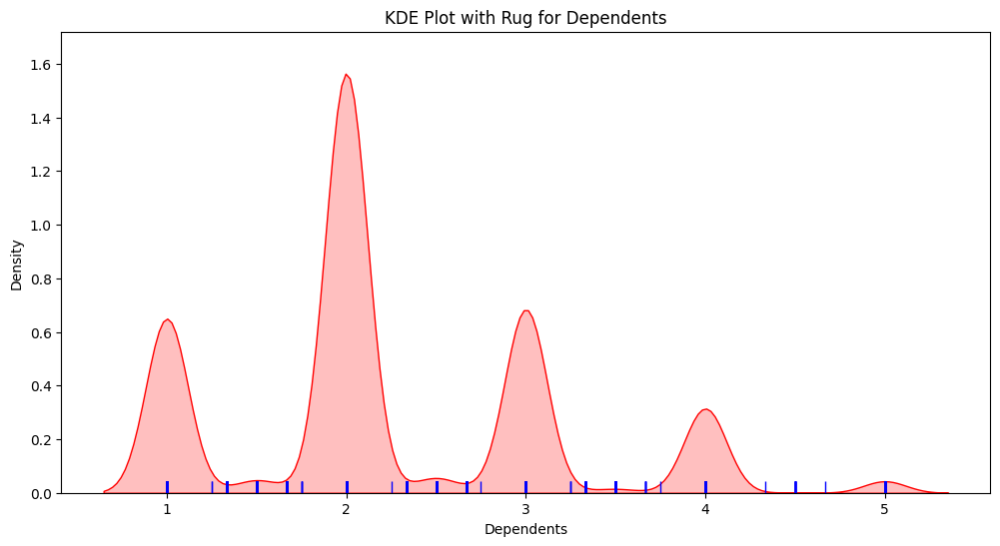

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


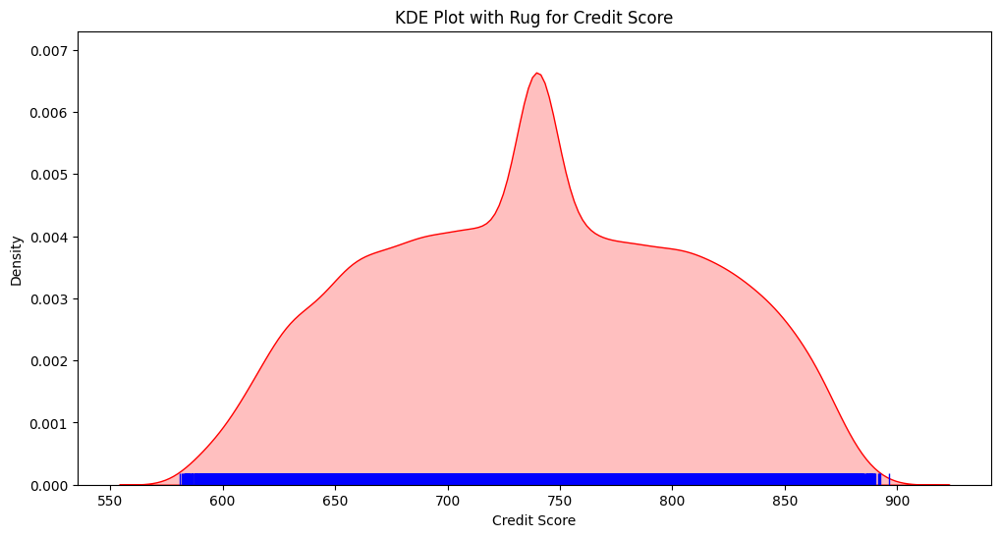

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


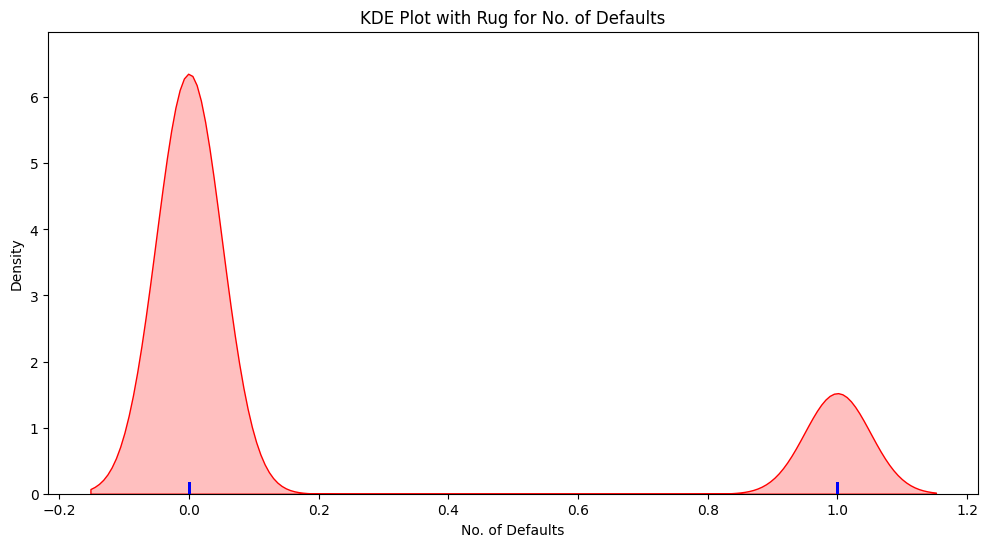

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


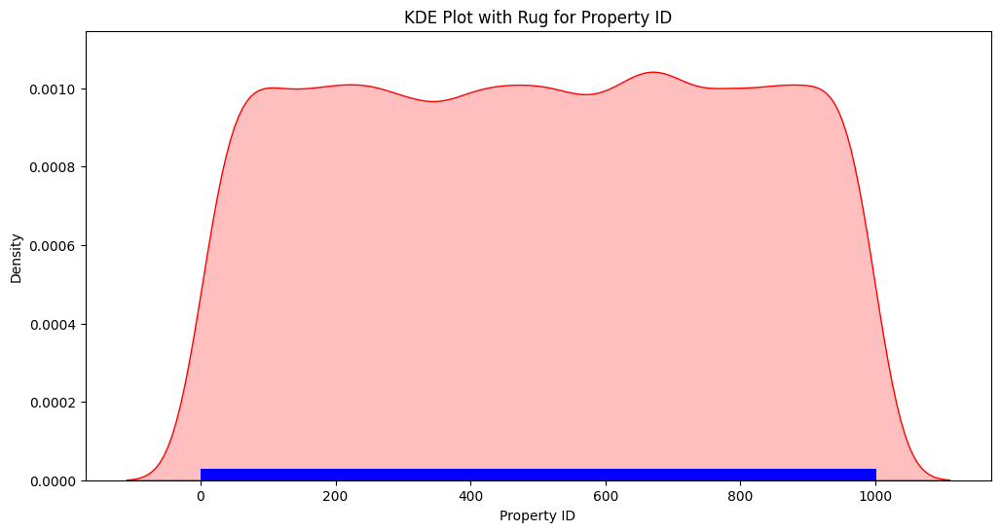

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


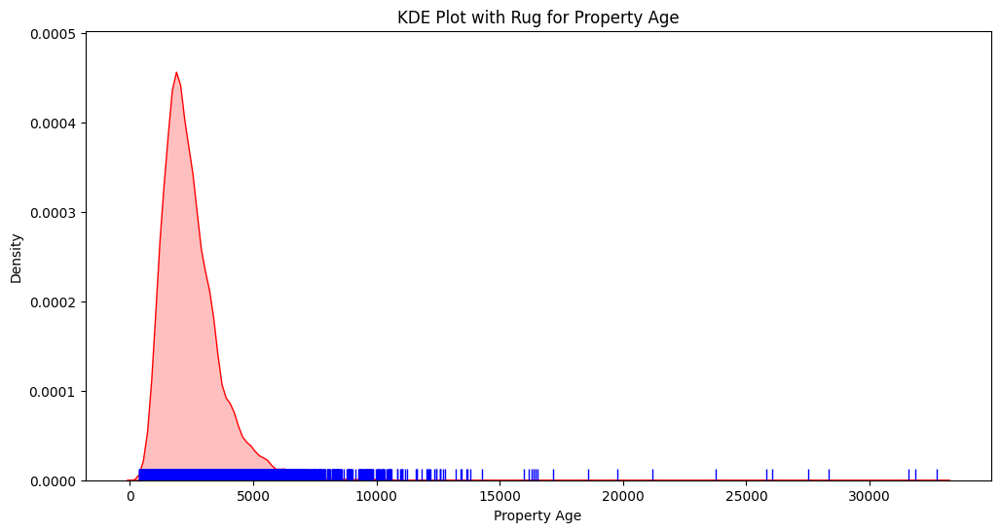

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


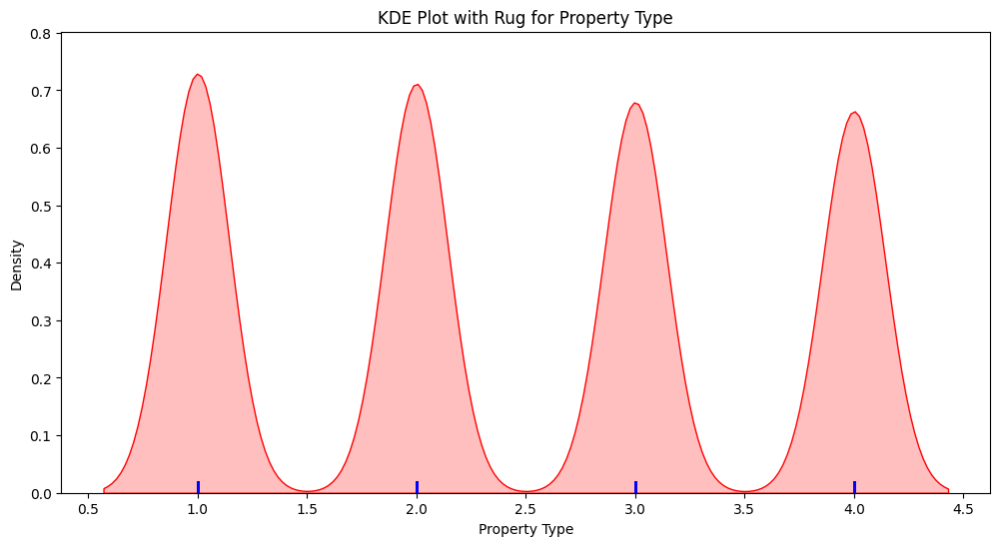

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


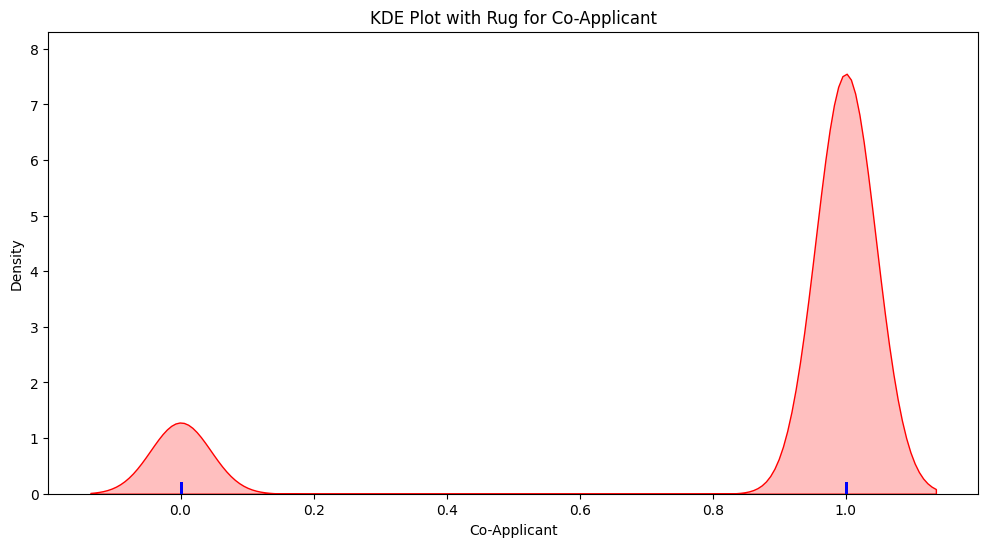

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


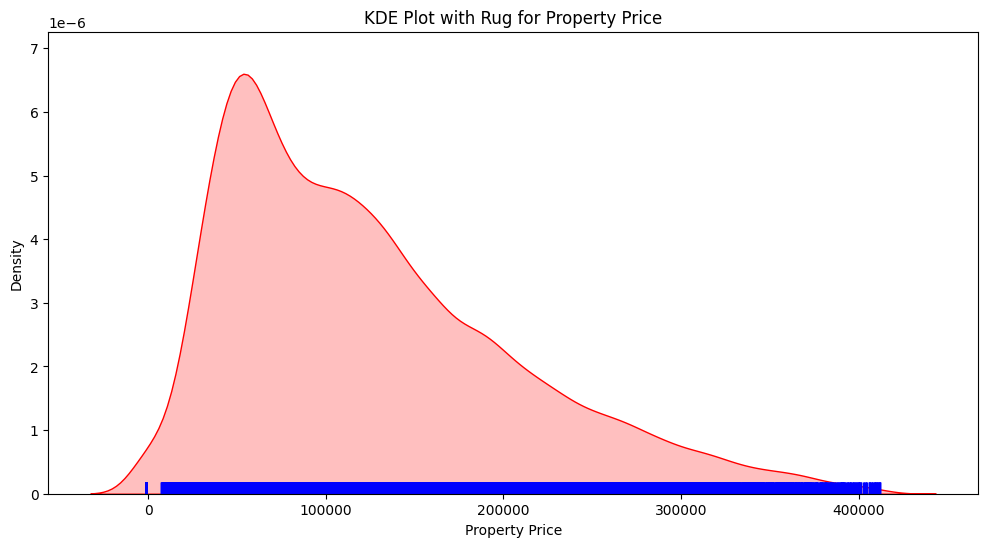

C:\Users\mehta\AppData\Local\Temp\ipykernel_21416\92659670.py:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True, color="r")


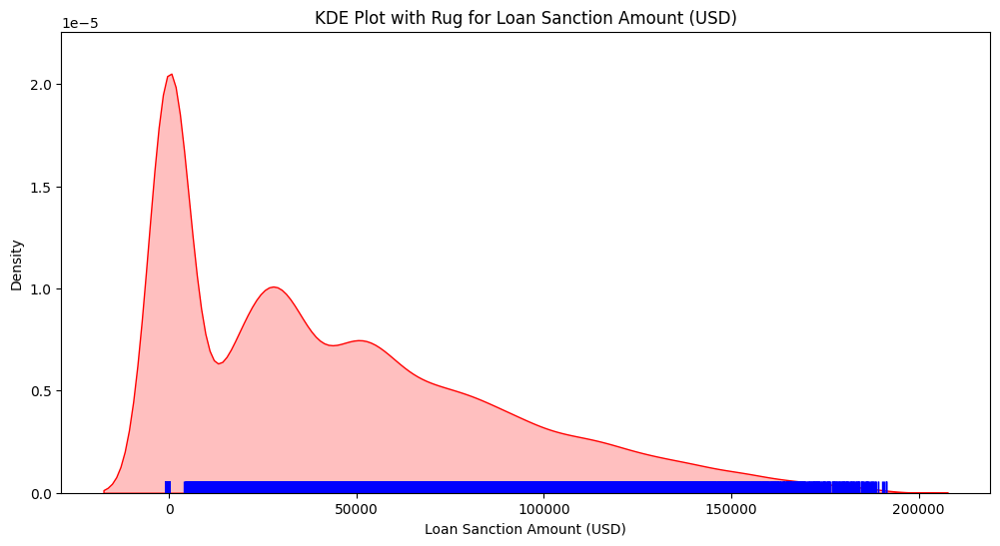

In [3]:
# KDE Plot with Rug Plot
for col in data.select_dtypes(include=['float64', 'int64']):
    plt.figure(figsize=(12, 6))
    sns.kdeplot(data[col], shade=True, color="r")
    sns.rugplot(data[col], color="b")
    plt.title(f'KDE Plot with Rug for {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()


### Bivariate Analysis

##### Joint Plot
###### A joint plot shows the relationship between two variables along with their marginal distributions.

<Figure size 1000x500 with 0 Axes>

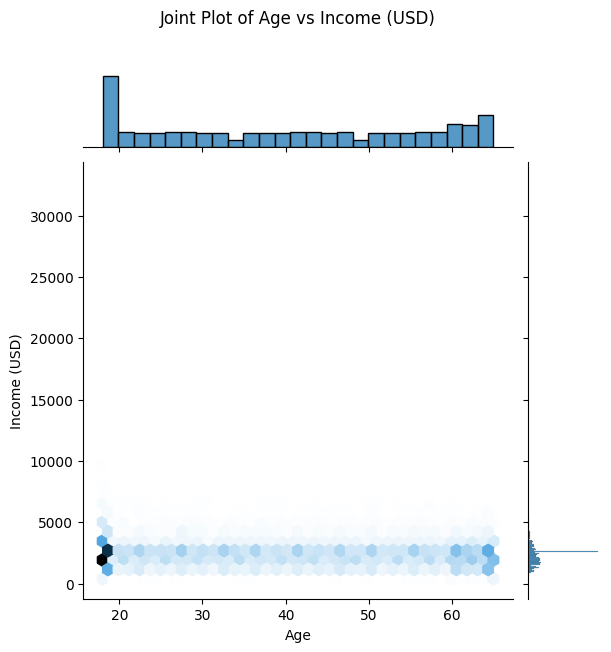

<Figure size 1000x500 with 0 Axes>

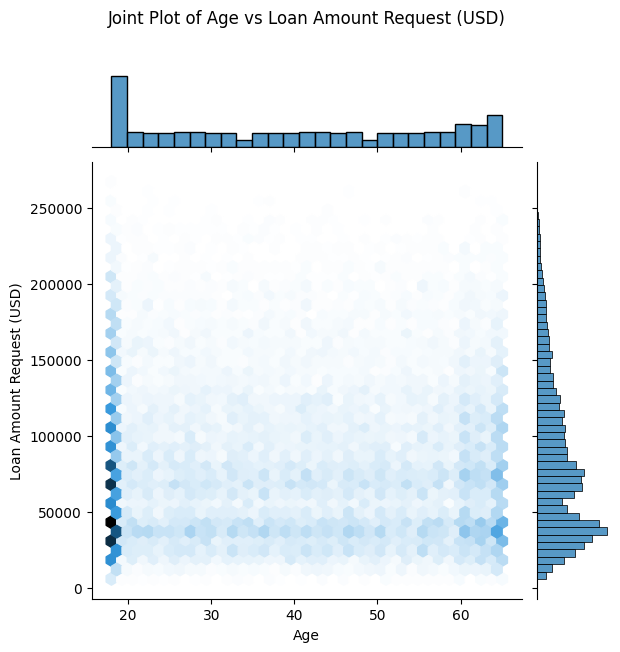

<Figure size 1000x500 with 0 Axes>

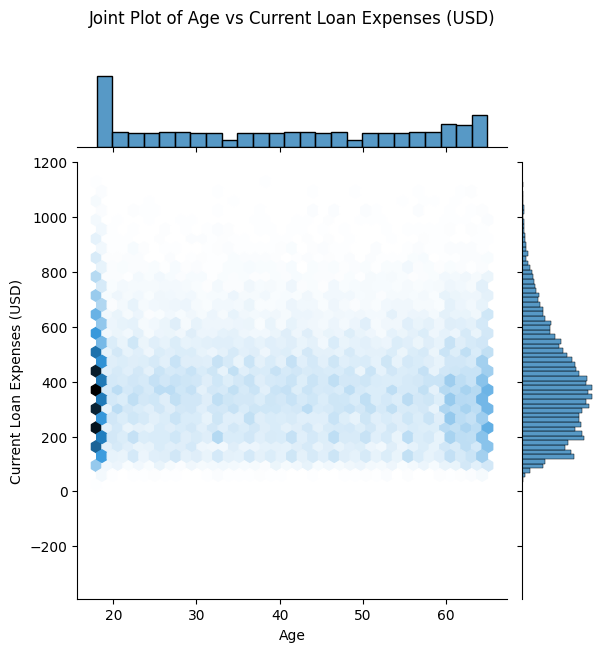

<Figure size 1000x500 with 0 Axes>

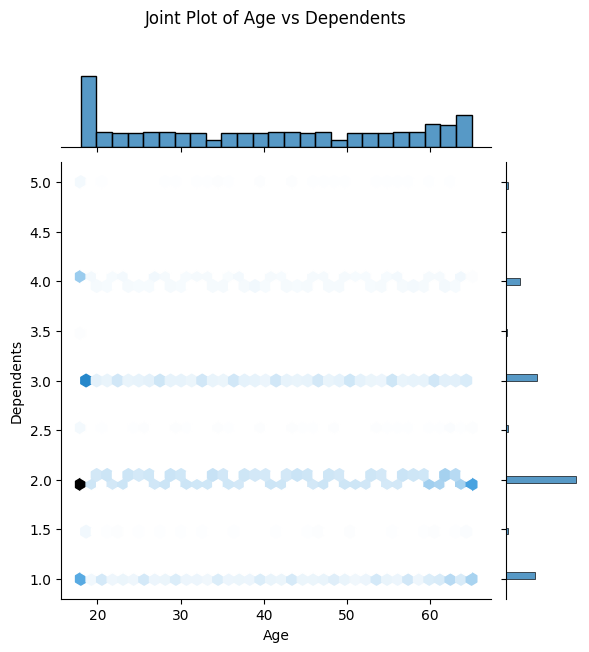

<Figure size 1000x500 with 0 Axes>

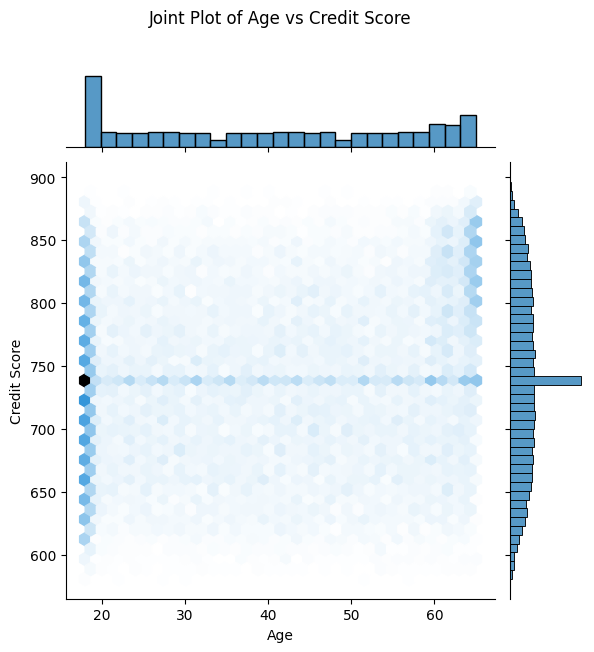

<Figure size 1000x500 with 0 Axes>

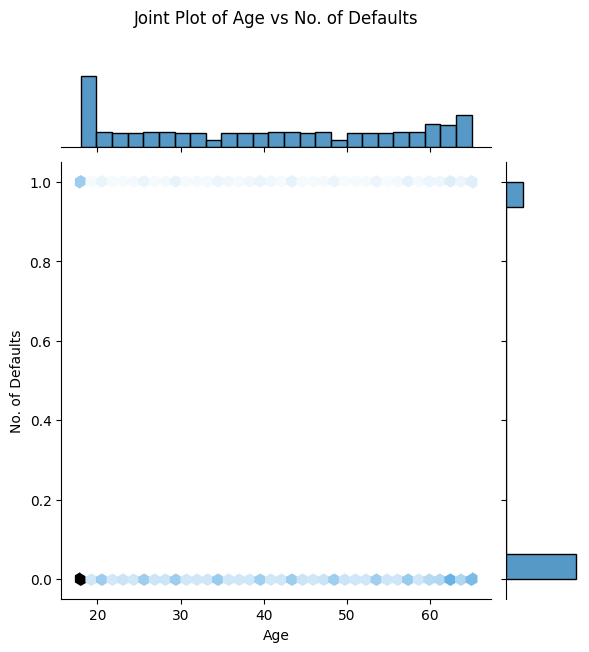

<Figure size 1000x500 with 0 Axes>

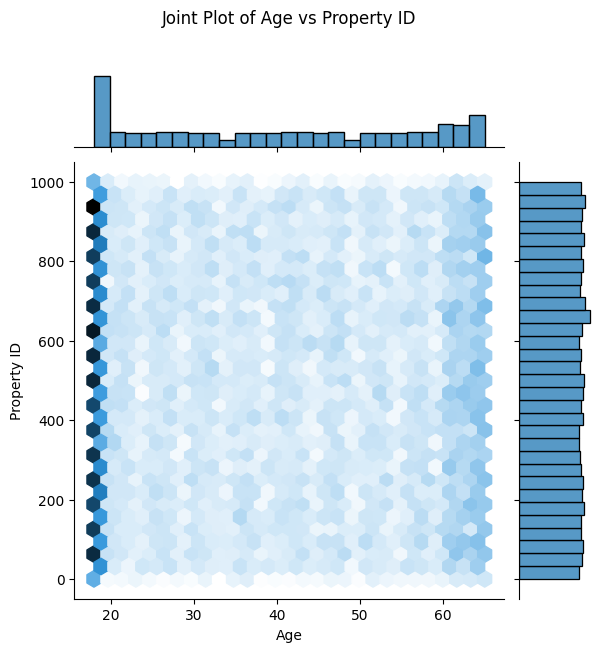

<Figure size 1000x500 with 0 Axes>

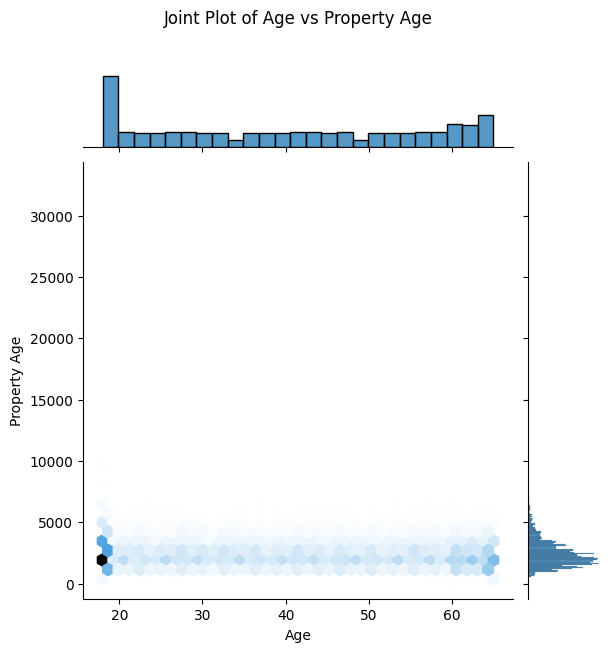

<Figure size 1000x500 with 0 Axes>

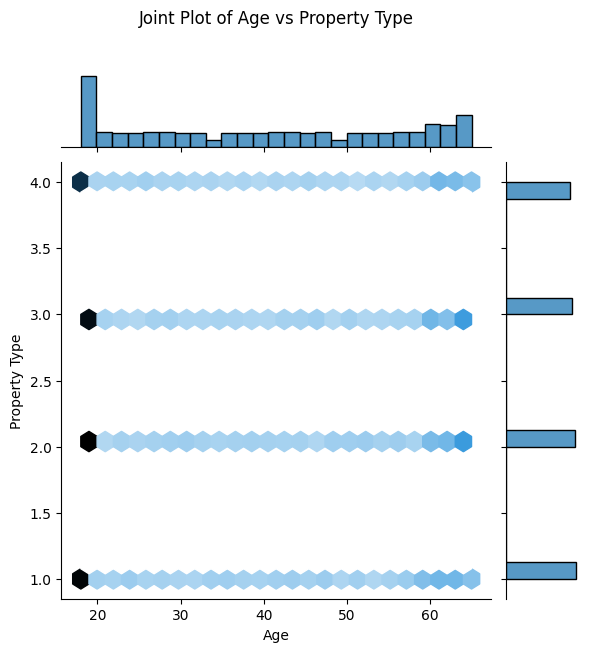

<Figure size 1000x500 with 0 Axes>

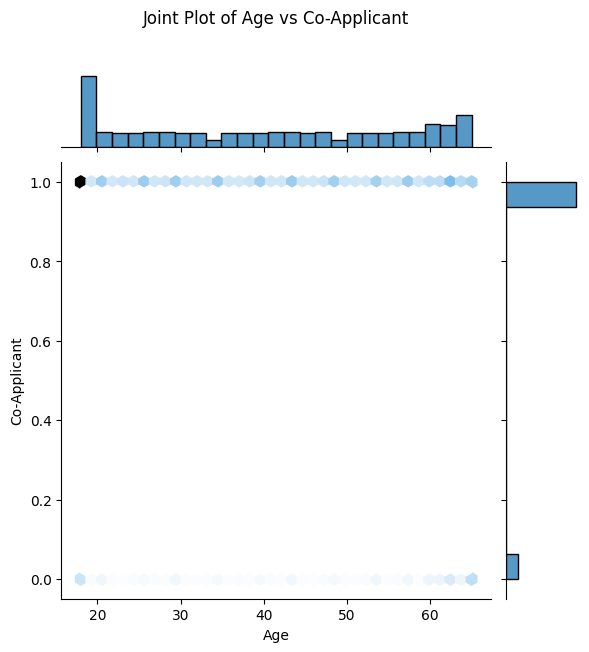

<Figure size 1000x500 with 0 Axes>

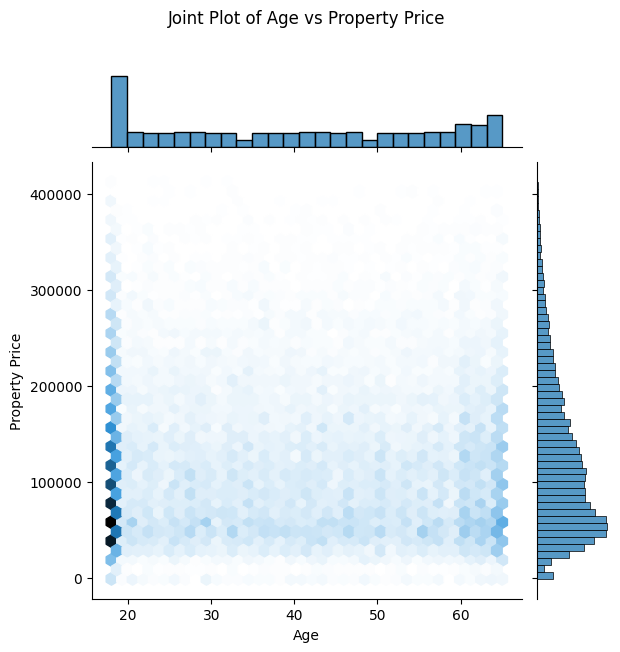

<Figure size 1000x500 with 0 Axes>

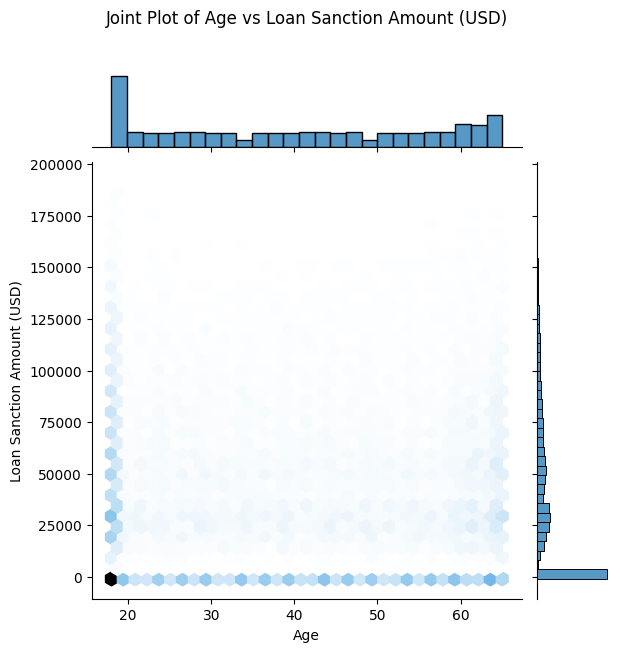

<Figure size 1000x500 with 0 Axes>

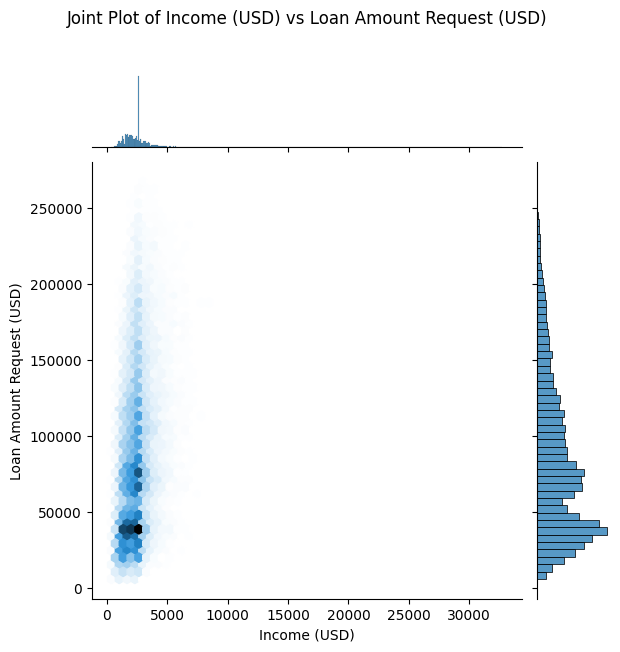

<Figure size 1000x500 with 0 Axes>

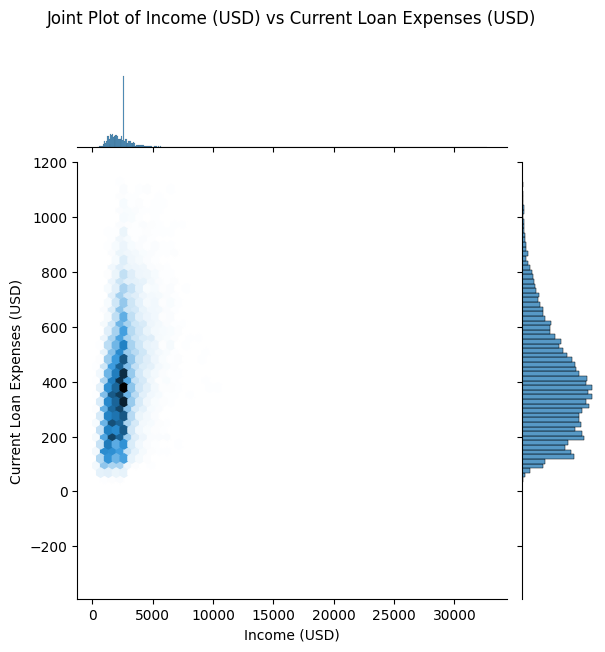

<Figure size 1000x500 with 0 Axes>

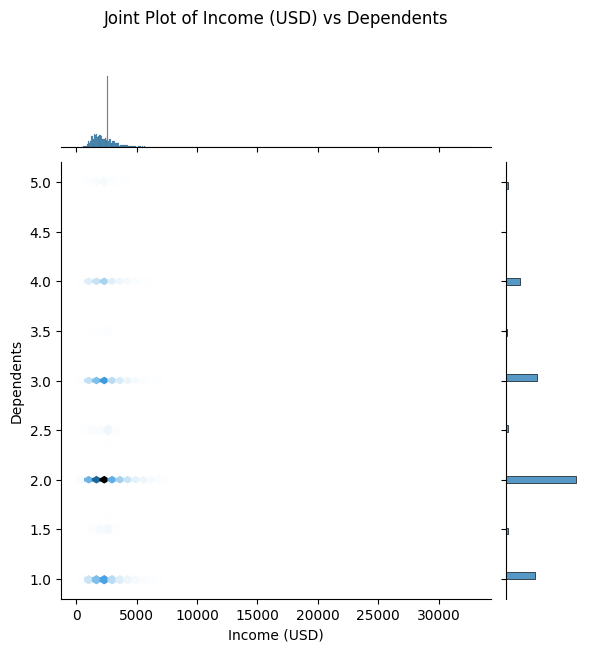

<Figure size 1000x500 with 0 Axes>

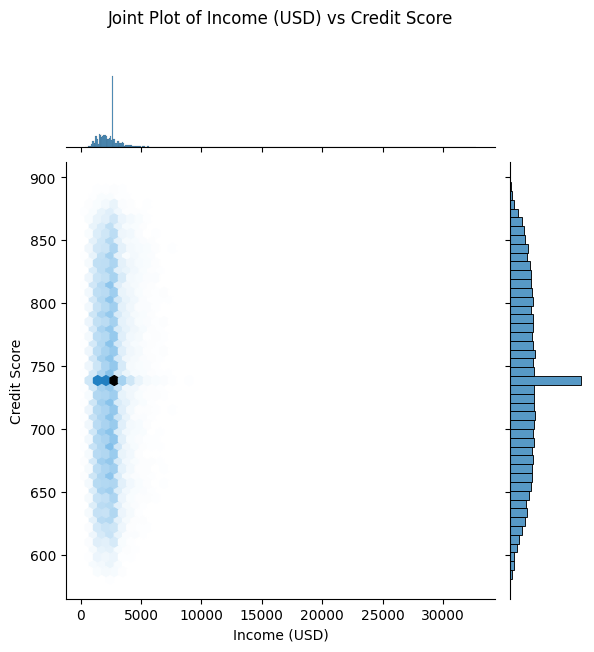

<Figure size 1000x500 with 0 Axes>

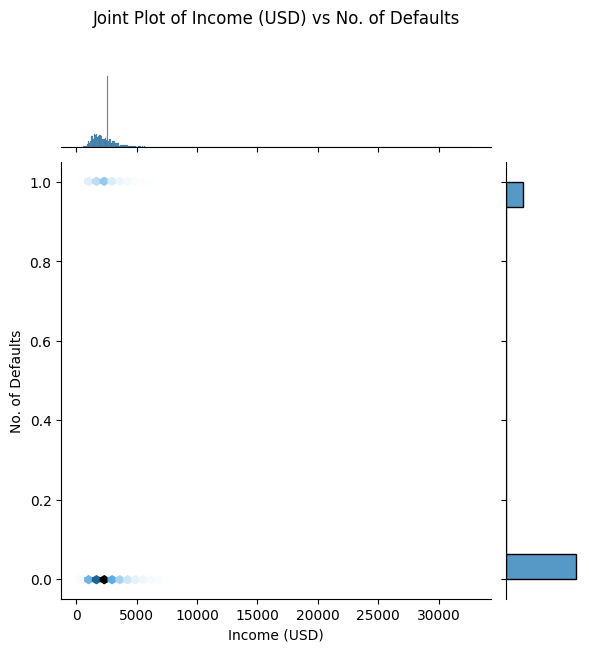

<Figure size 1000x500 with 0 Axes>

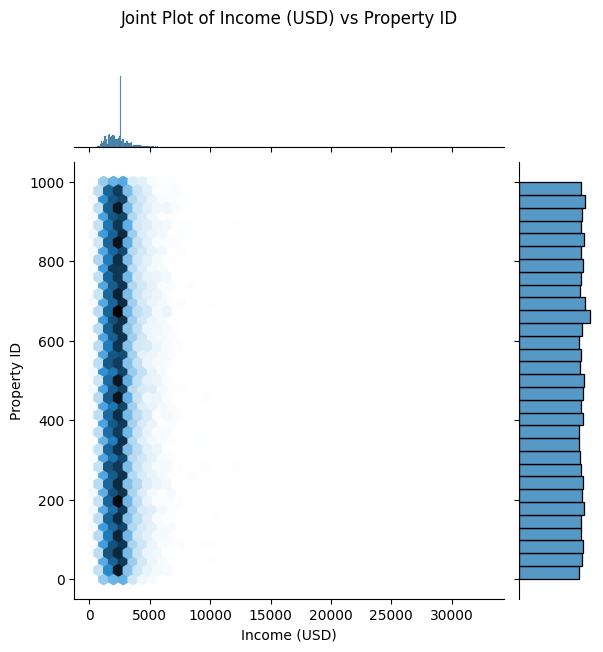

<Figure size 1000x500 with 0 Axes>

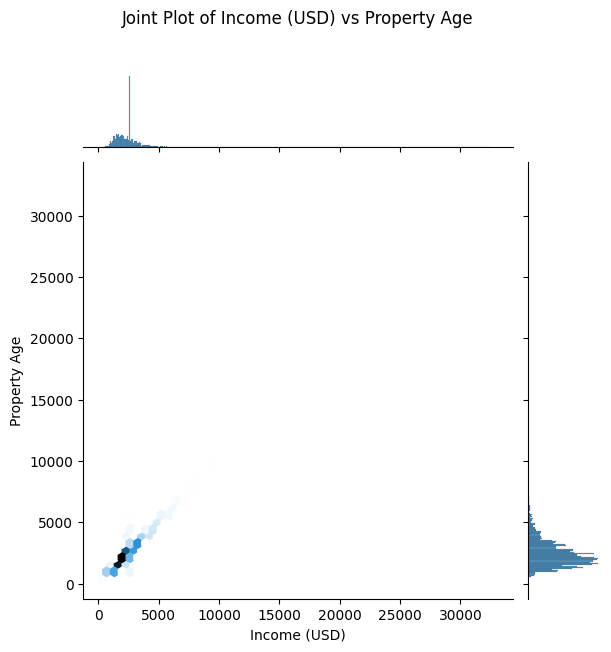

<Figure size 1000x500 with 0 Axes>

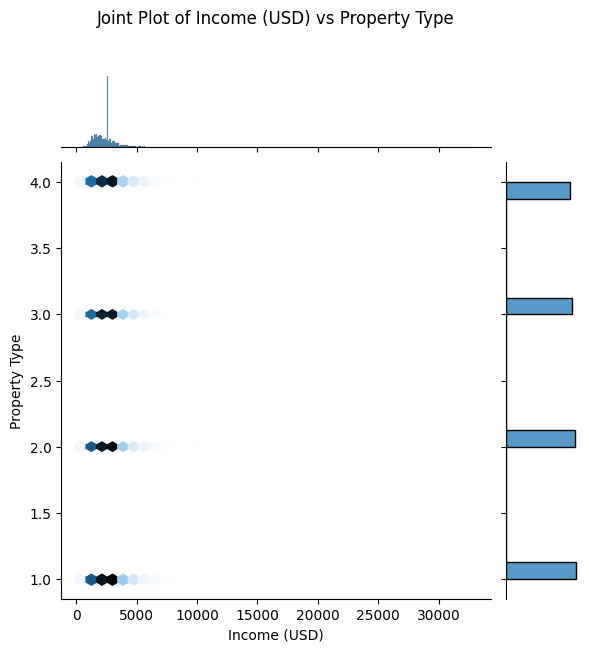

<Figure size 1000x500 with 0 Axes>

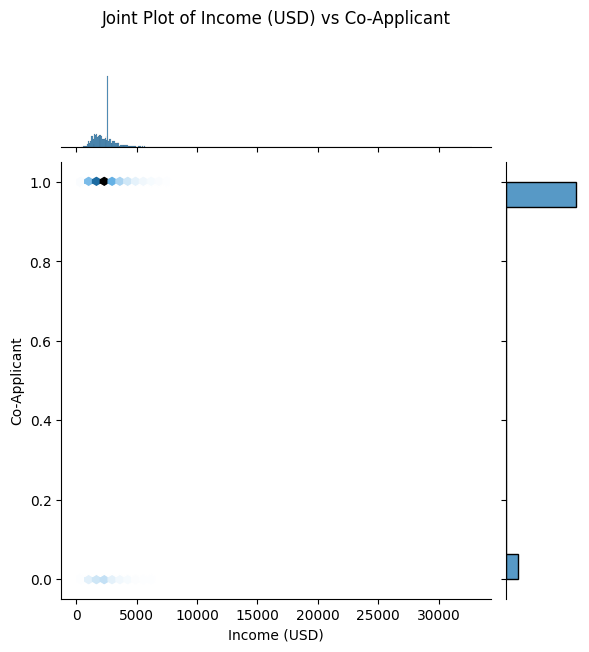

<Figure size 1000x500 with 0 Axes>

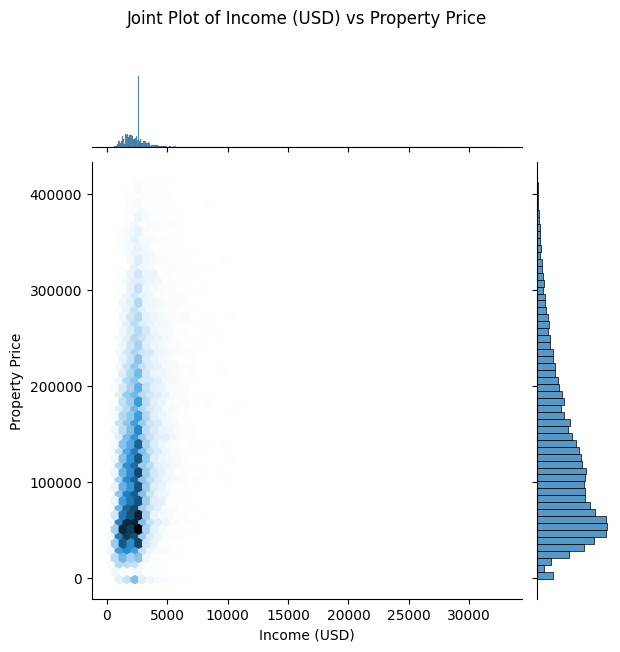

<Figure size 1000x500 with 0 Axes>

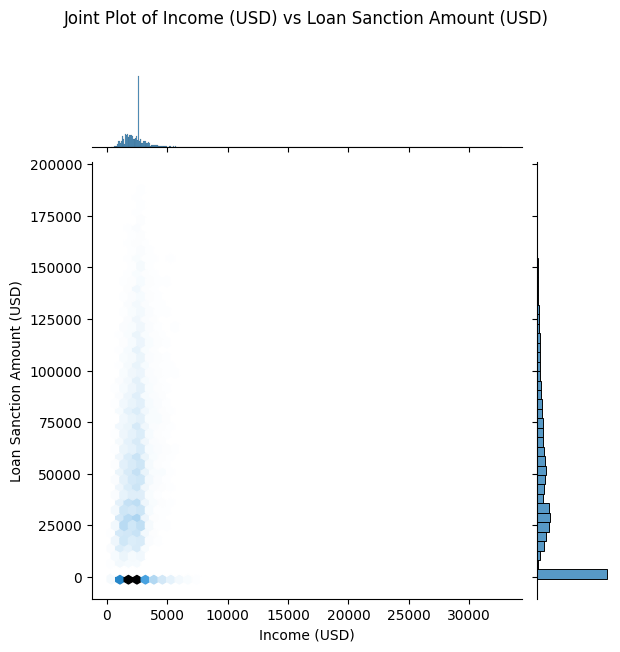

<Figure size 1000x500 with 0 Axes>

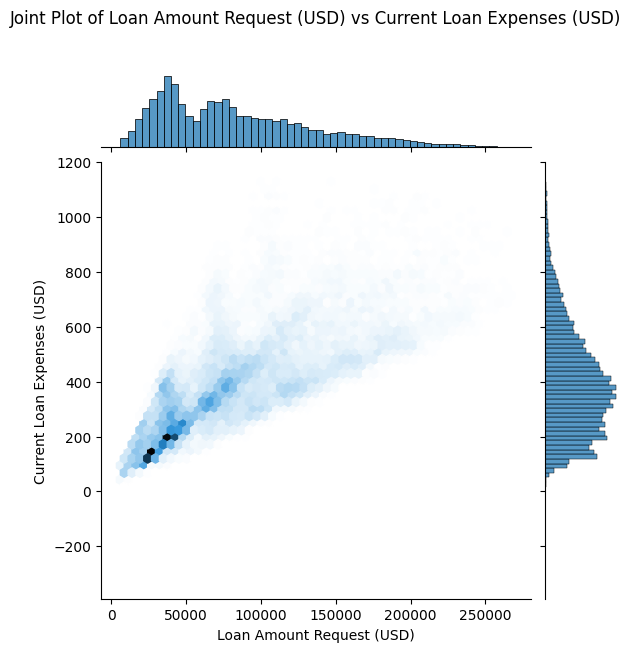

<Figure size 1000x500 with 0 Axes>

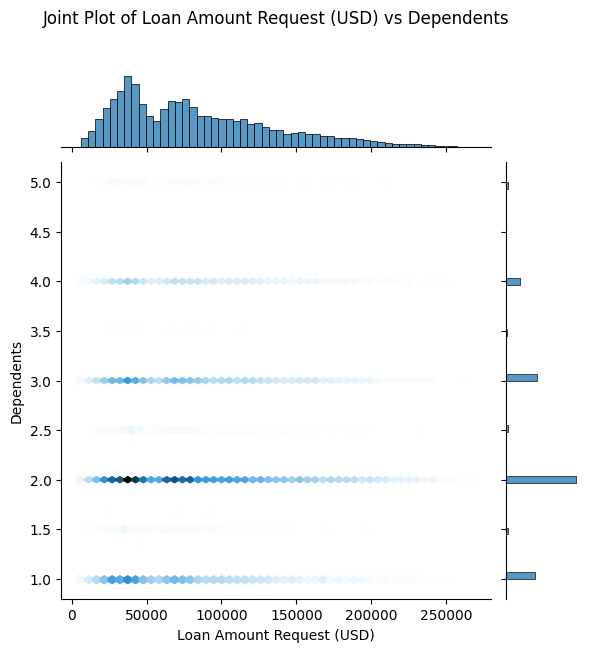

<Figure size 1000x500 with 0 Axes>

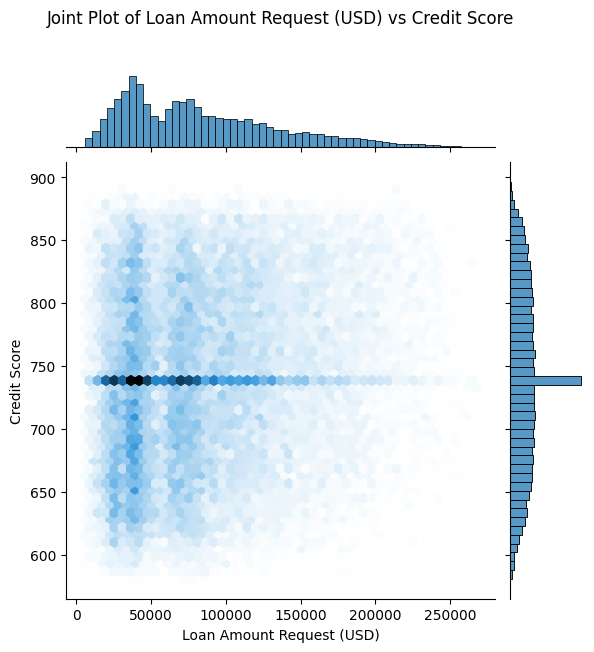

<Figure size 1000x500 with 0 Axes>

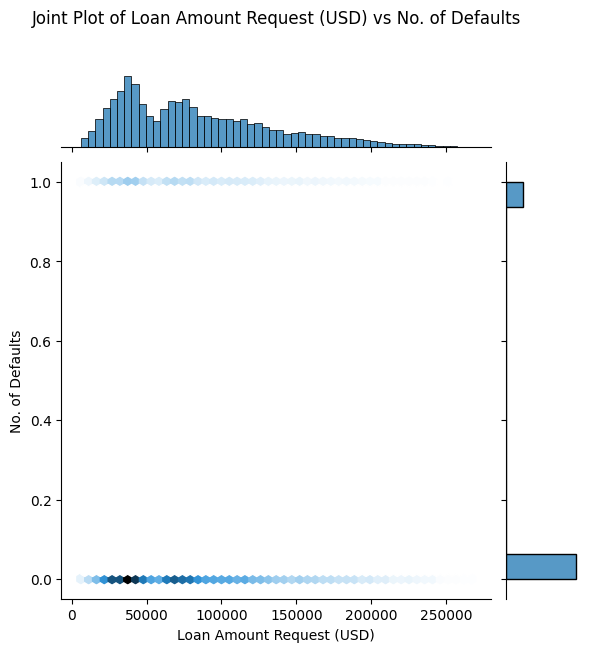

<Figure size 1000x500 with 0 Axes>

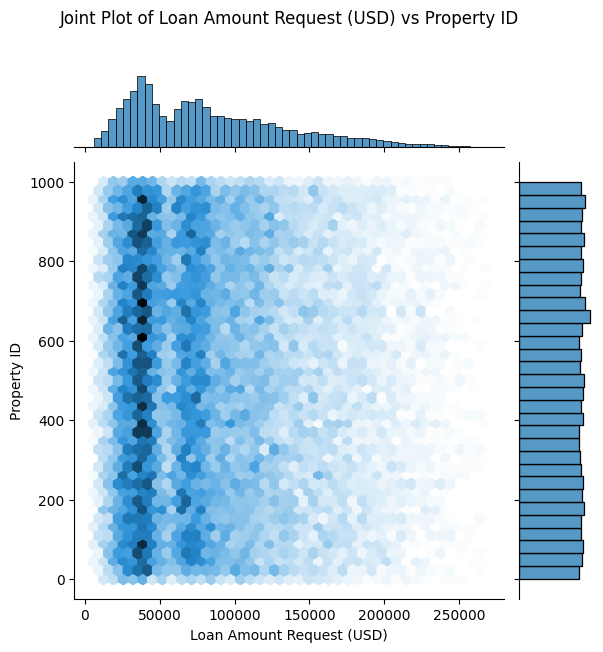

<Figure size 1000x500 with 0 Axes>

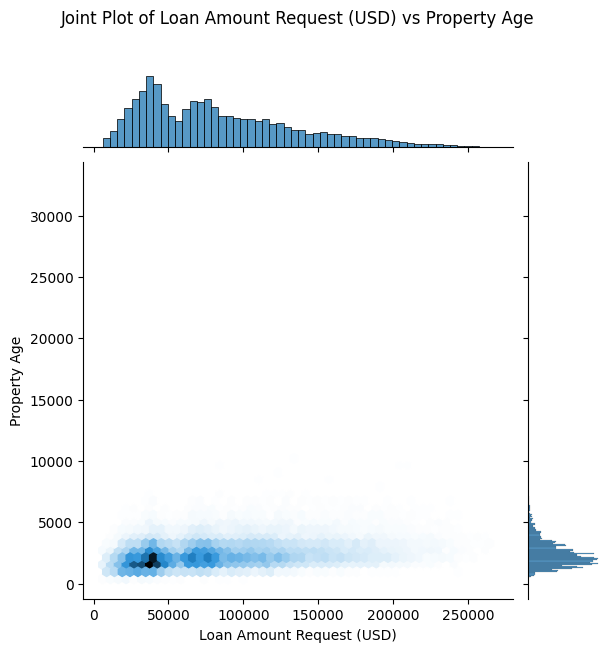

<Figure size 1000x500 with 0 Axes>

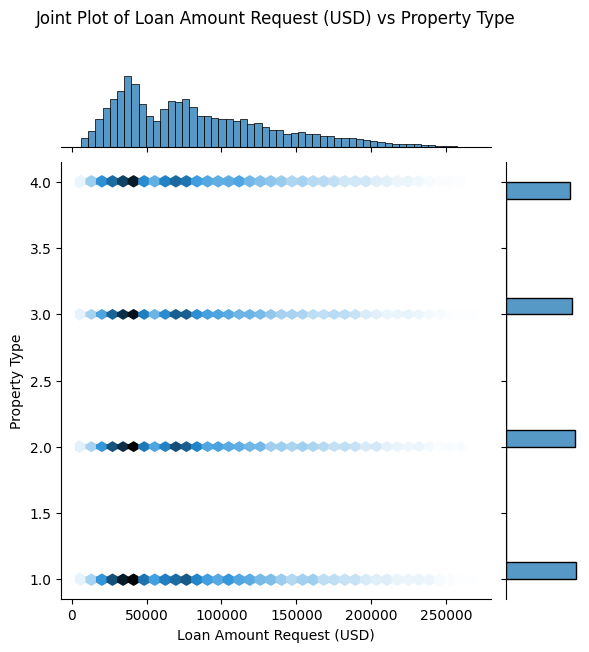

<Figure size 1000x500 with 0 Axes>

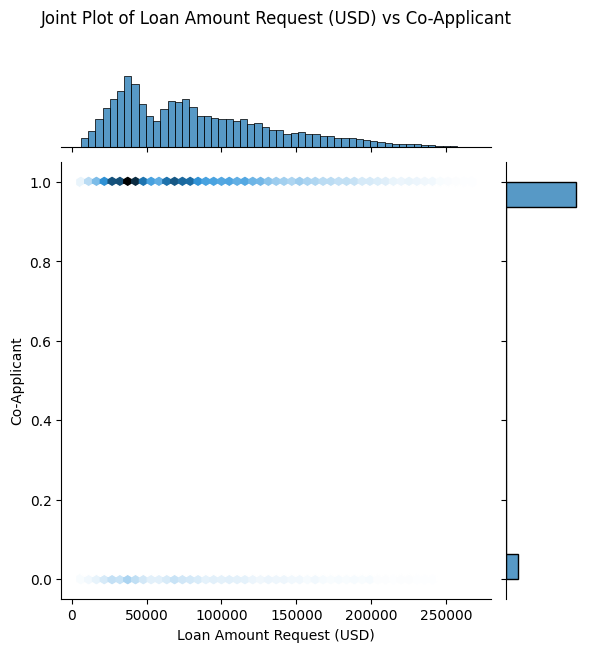

<Figure size 1000x500 with 0 Axes>

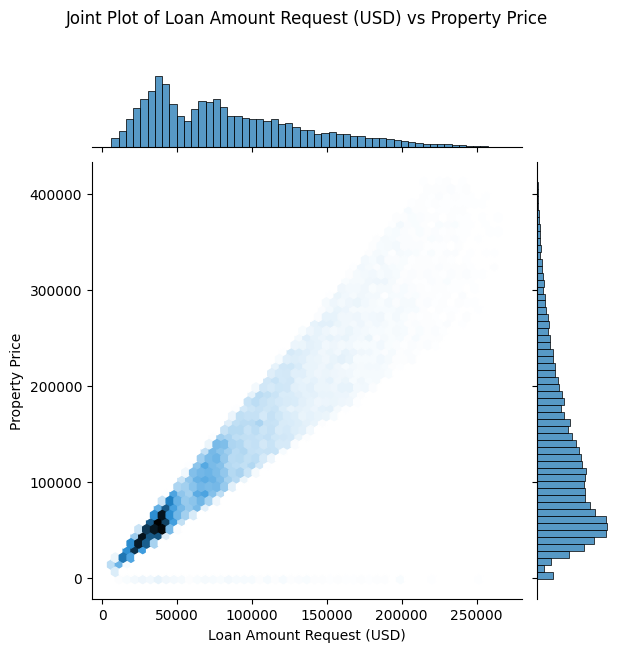

<Figure size 1000x500 with 0 Axes>

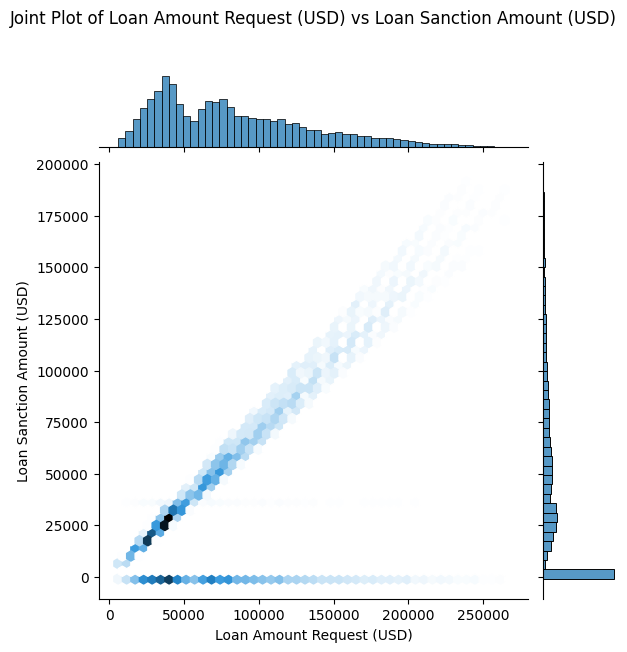

<Figure size 1000x500 with 0 Axes>

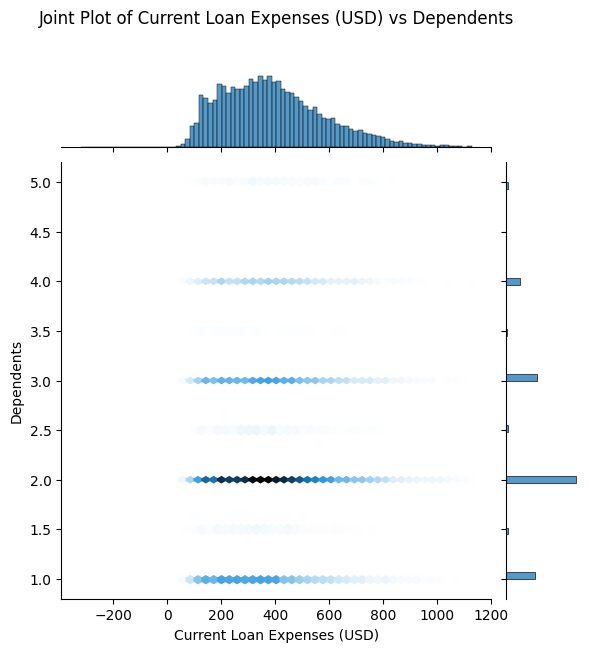

<Figure size 1000x500 with 0 Axes>

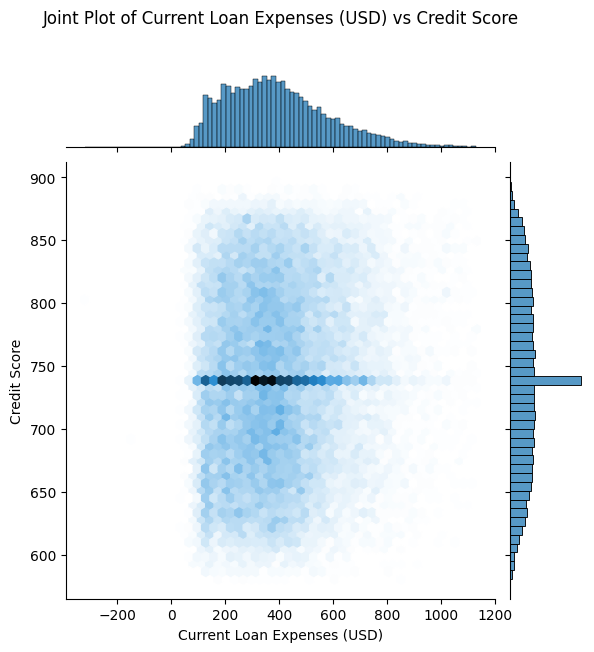

<Figure size 1000x500 with 0 Axes>

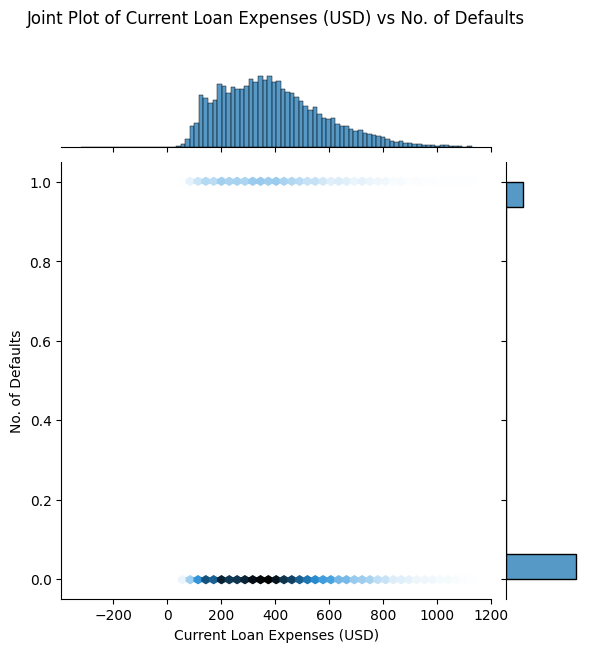

<Figure size 1000x500 with 0 Axes>

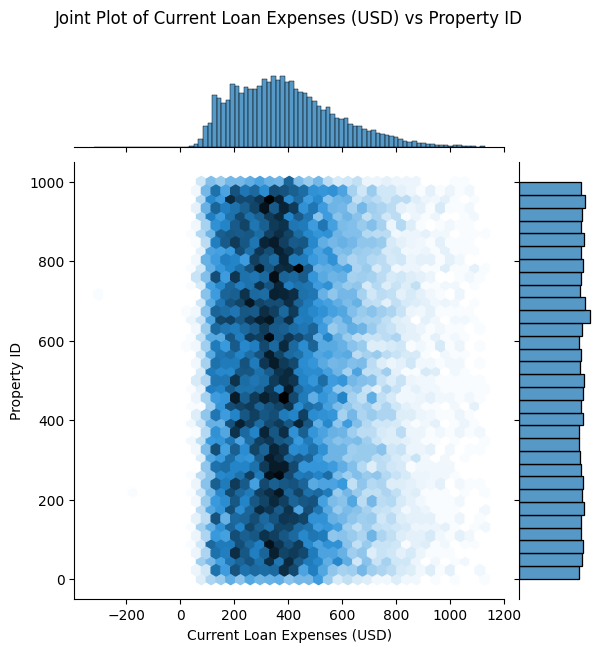

<Figure size 1000x500 with 0 Axes>

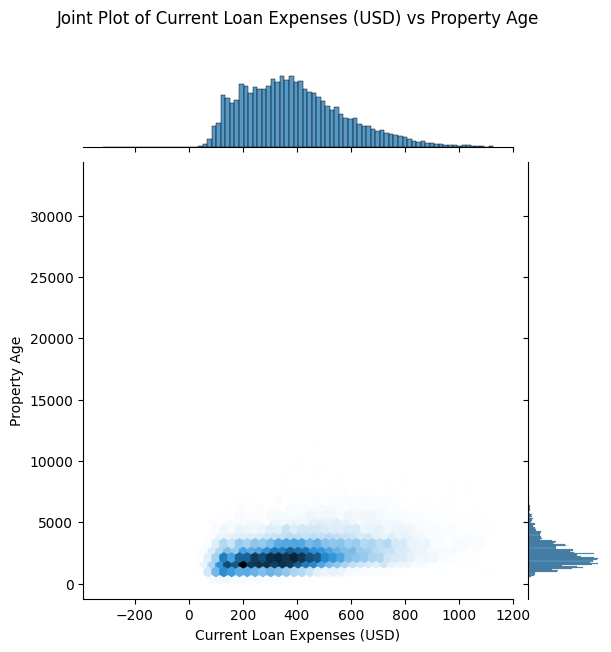

<Figure size 1000x500 with 0 Axes>

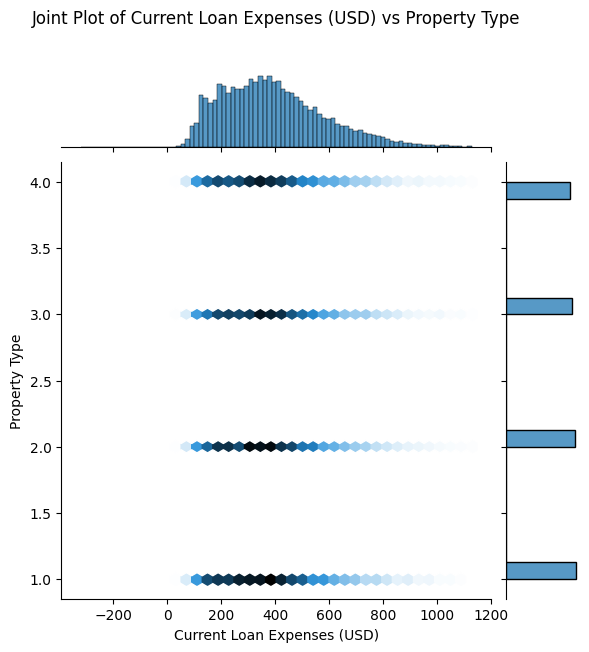

<Figure size 1000x500 with 0 Axes>

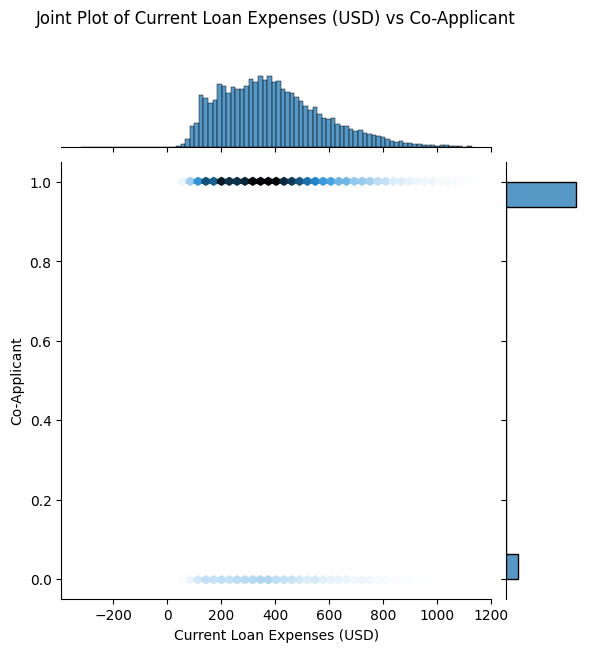

<Figure size 1000x500 with 0 Axes>

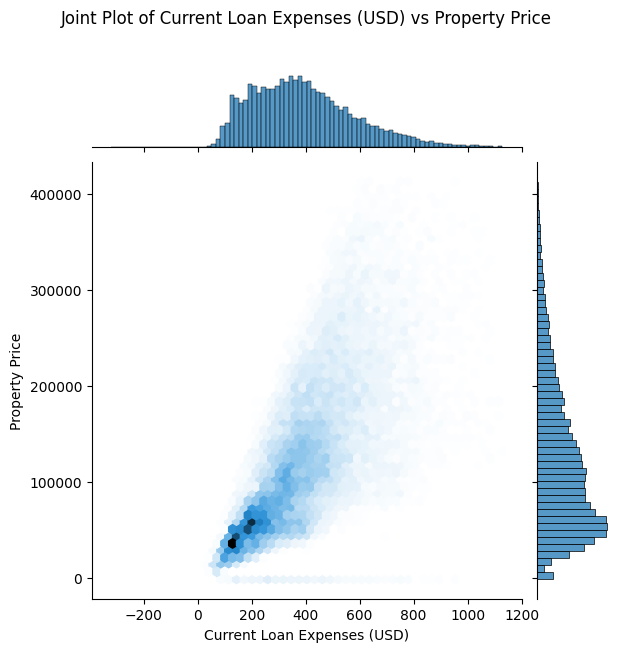

<Figure size 1000x500 with 0 Axes>

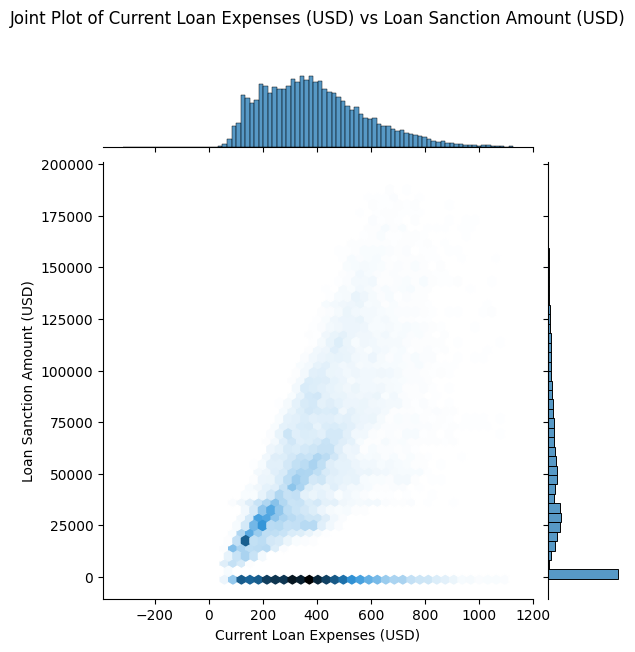

<Figure size 1000x500 with 0 Axes>

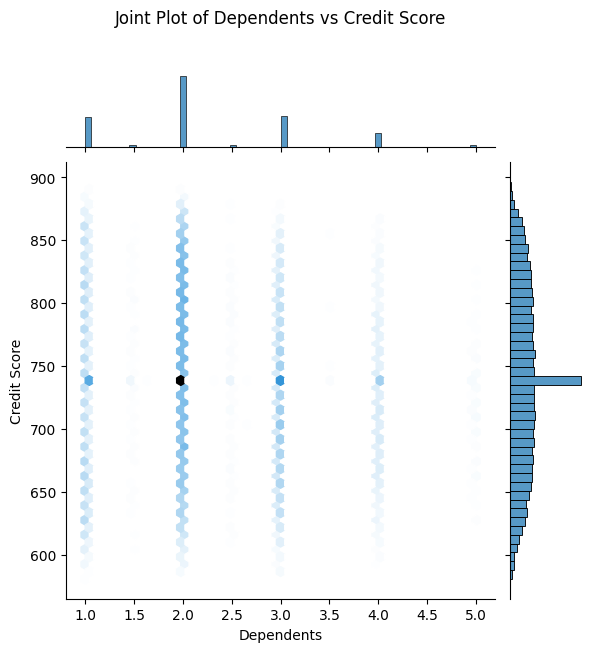

<Figure size 1000x500 with 0 Axes>

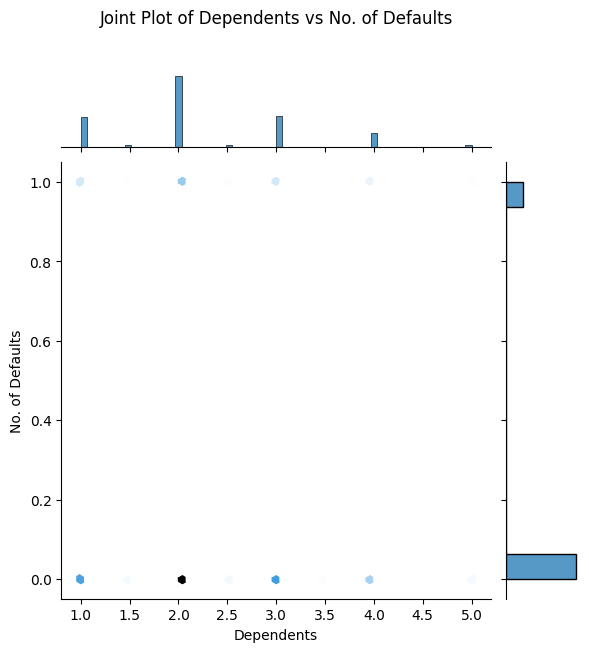

<Figure size 1000x500 with 0 Axes>

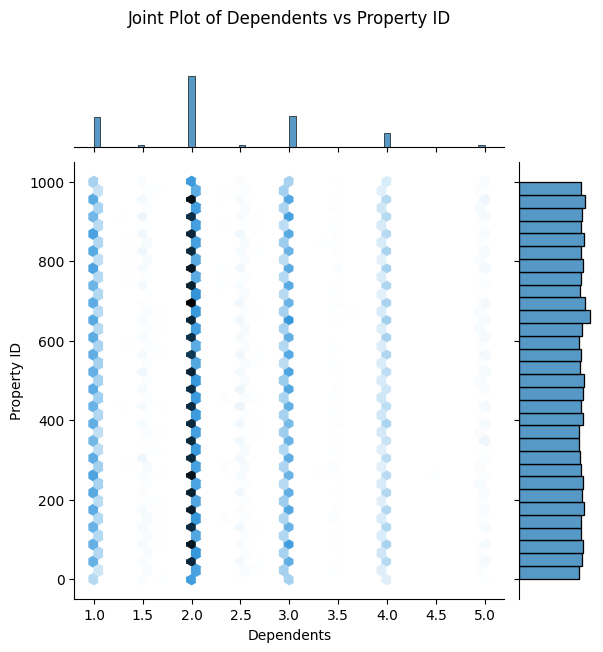

<Figure size 1000x500 with 0 Axes>

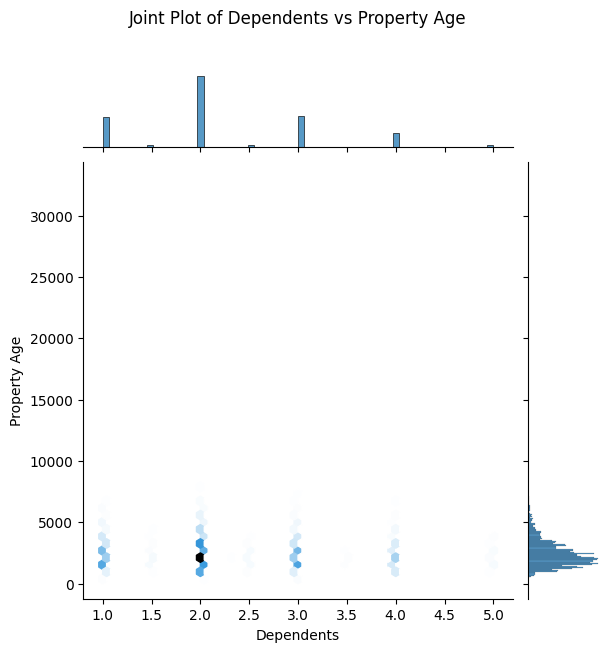

<Figure size 1000x500 with 0 Axes>

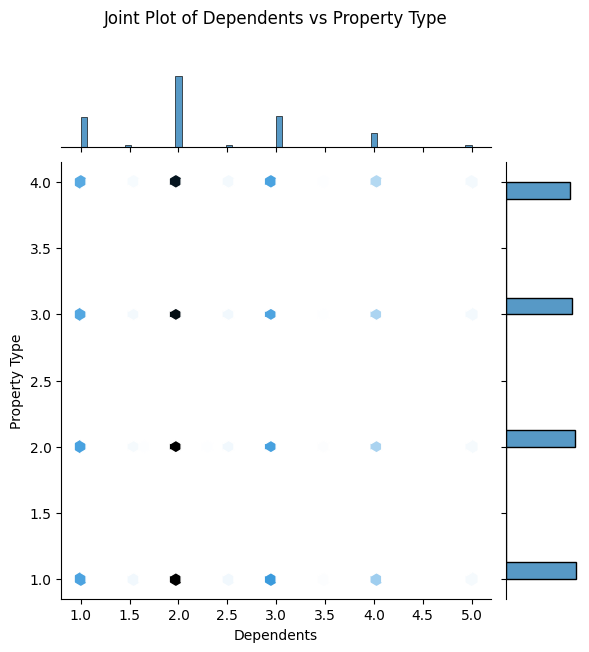

<Figure size 1000x500 with 0 Axes>

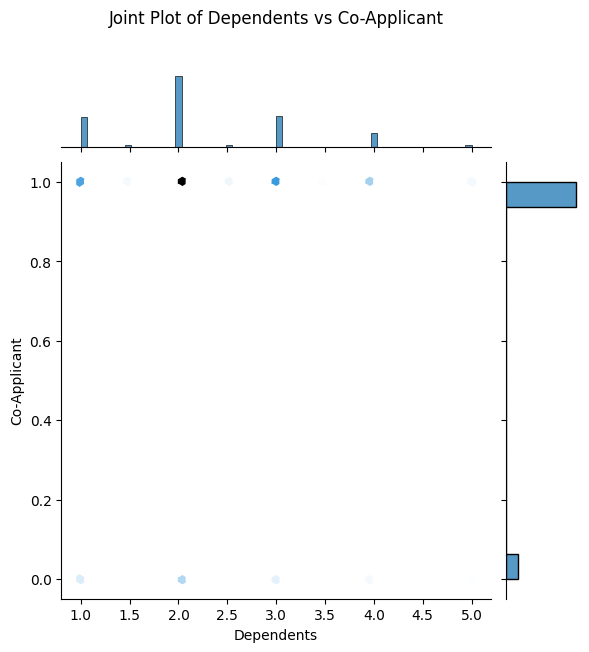

<Figure size 1000x500 with 0 Axes>

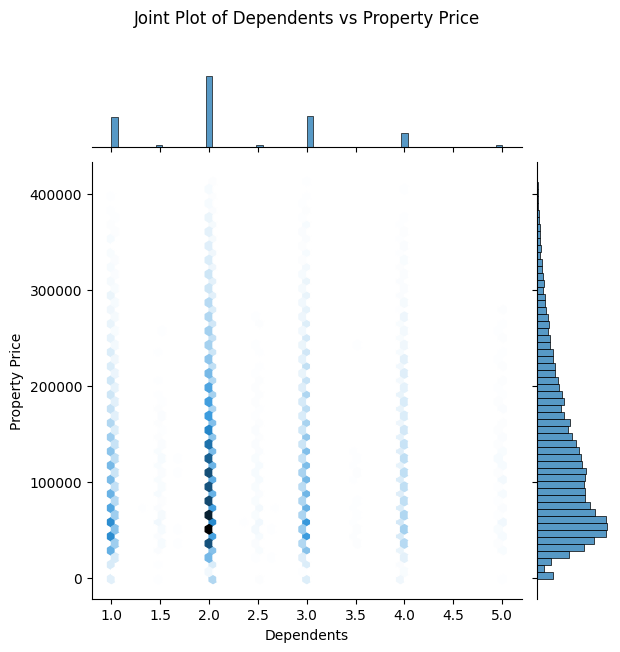

<Figure size 1000x500 with 0 Axes>

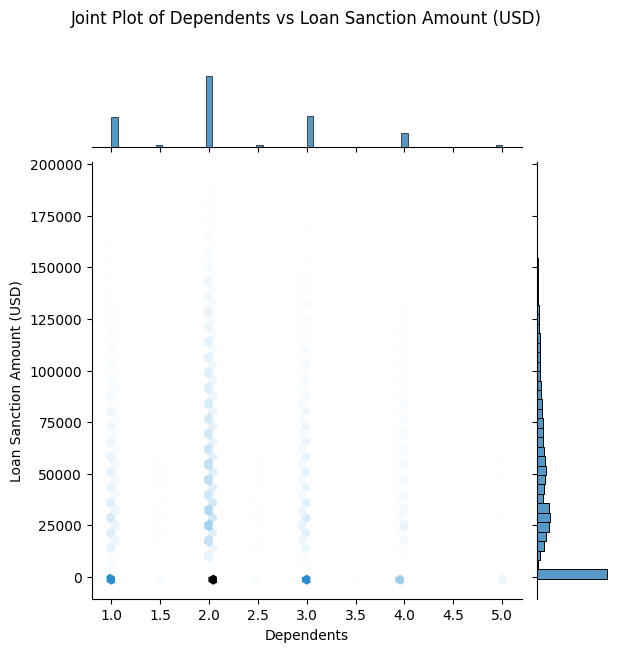

<Figure size 1000x500 with 0 Axes>

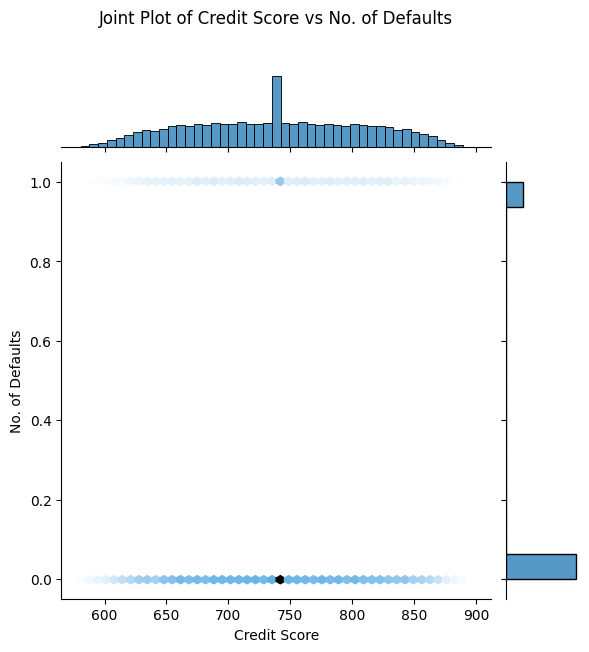

<Figure size 1000x500 with 0 Axes>

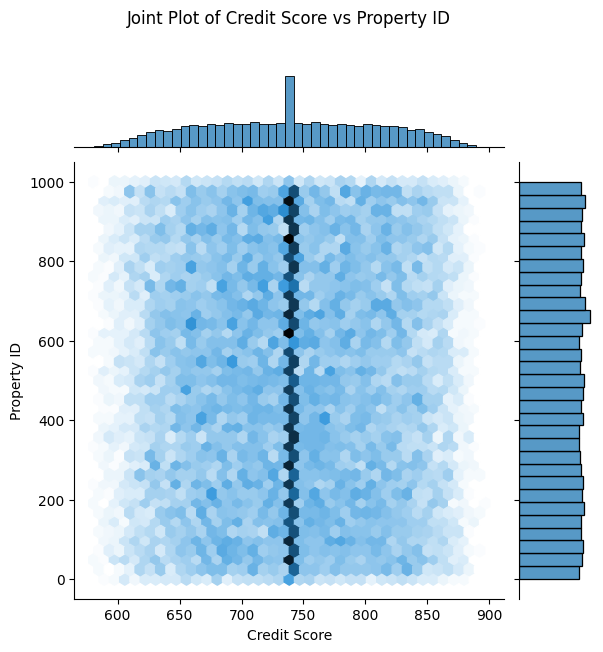

<Figure size 1000x500 with 0 Axes>

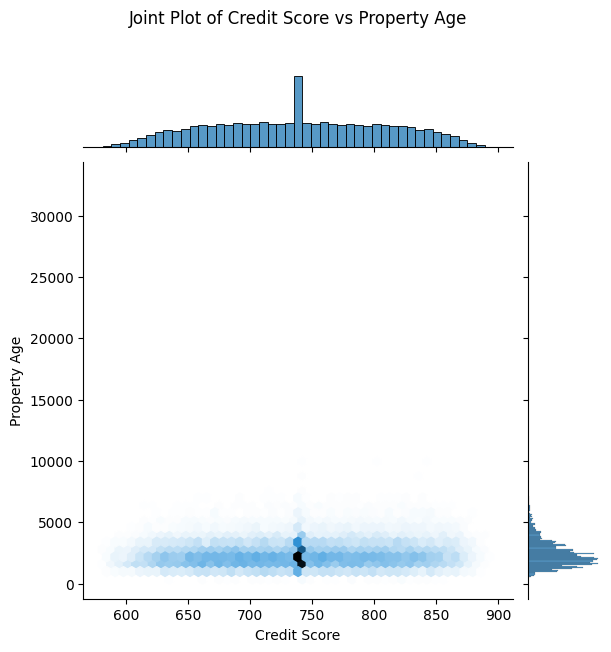

<Figure size 1000x500 with 0 Axes>

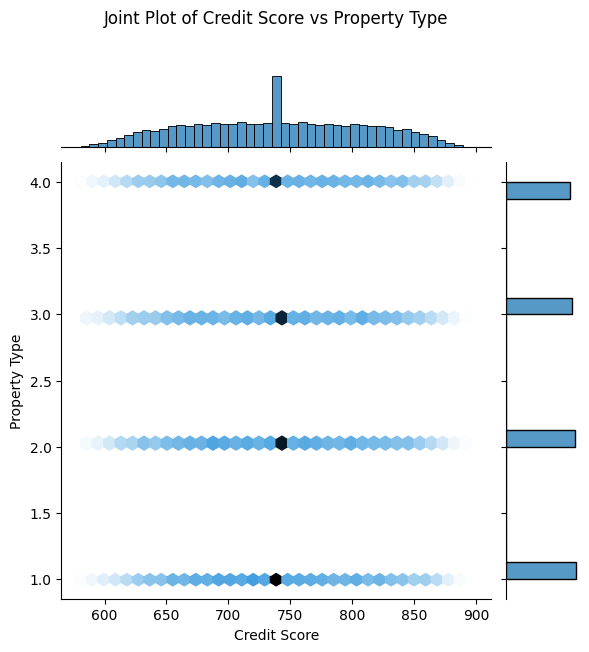

<Figure size 1000x500 with 0 Axes>

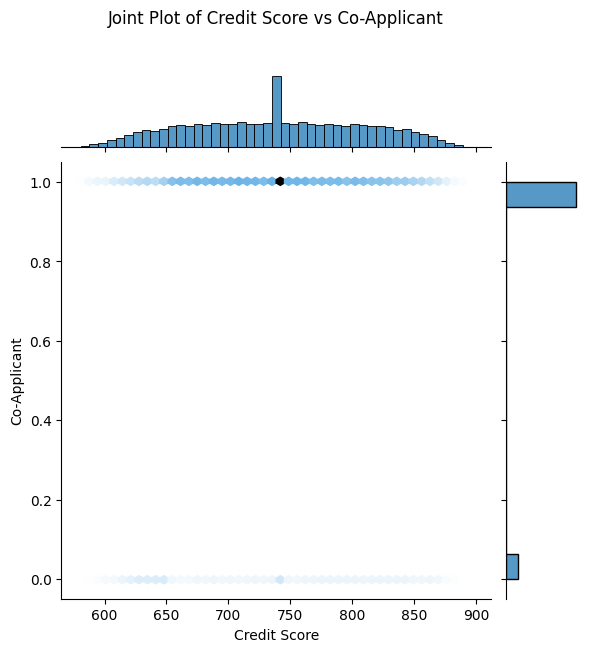

<Figure size 1000x500 with 0 Axes>

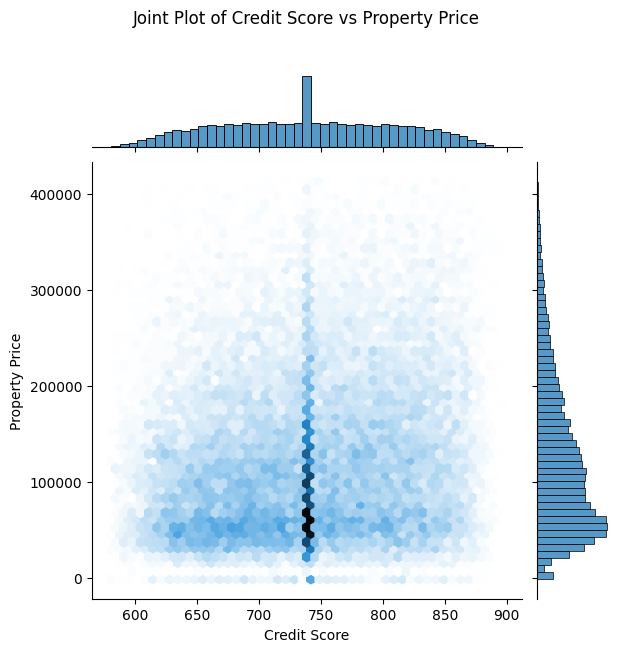

<Figure size 1000x500 with 0 Axes>

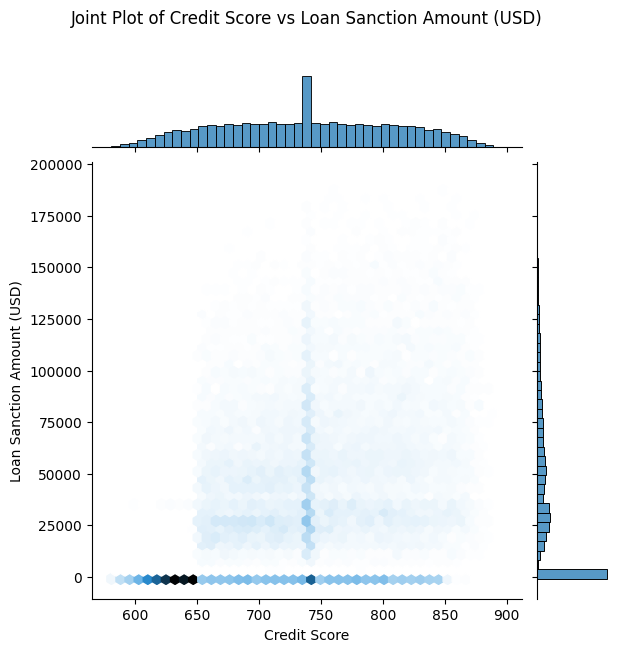

<Figure size 1000x500 with 0 Axes>

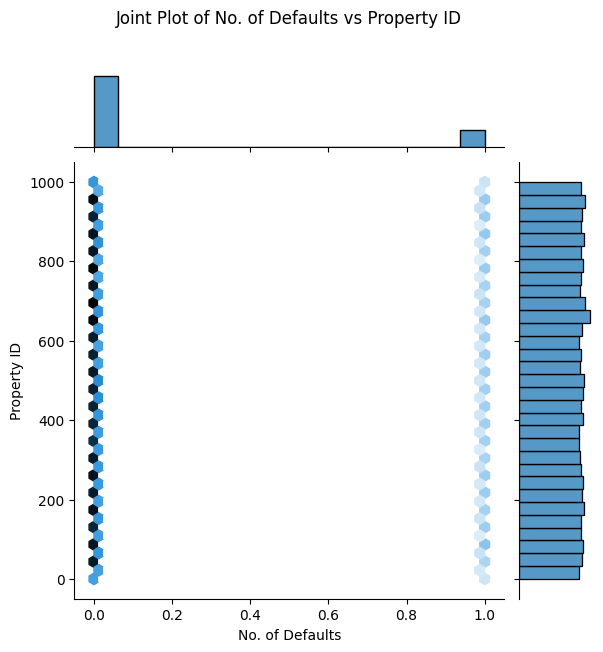

<Figure size 1000x500 with 0 Axes>

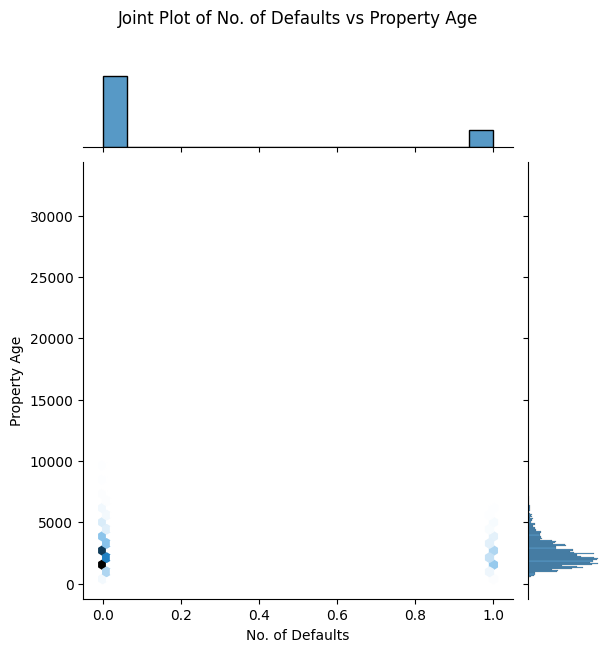

<Figure size 1000x500 with 0 Axes>

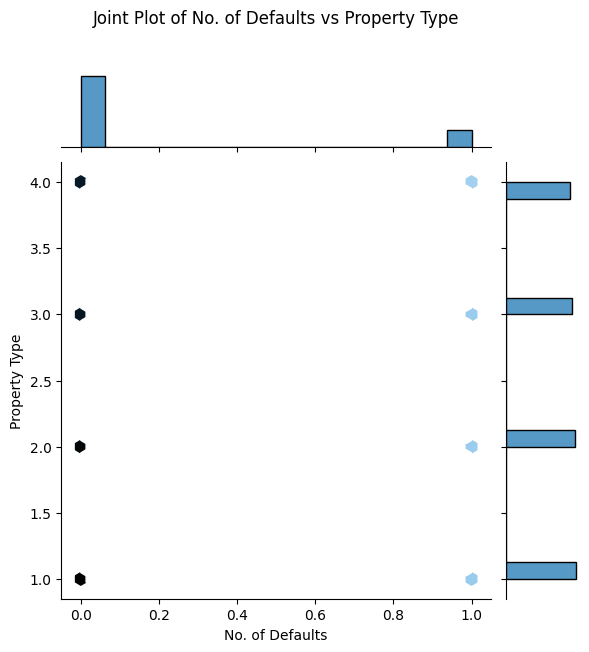

<Figure size 1000x500 with 0 Axes>

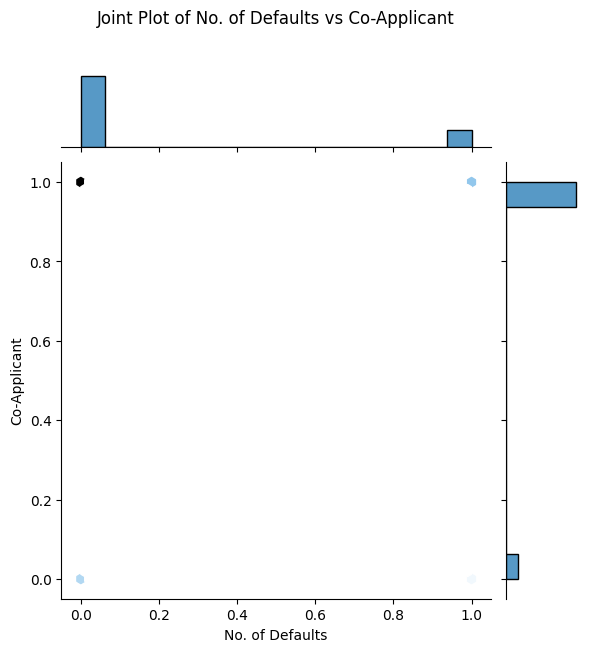

<Figure size 1000x500 with 0 Axes>

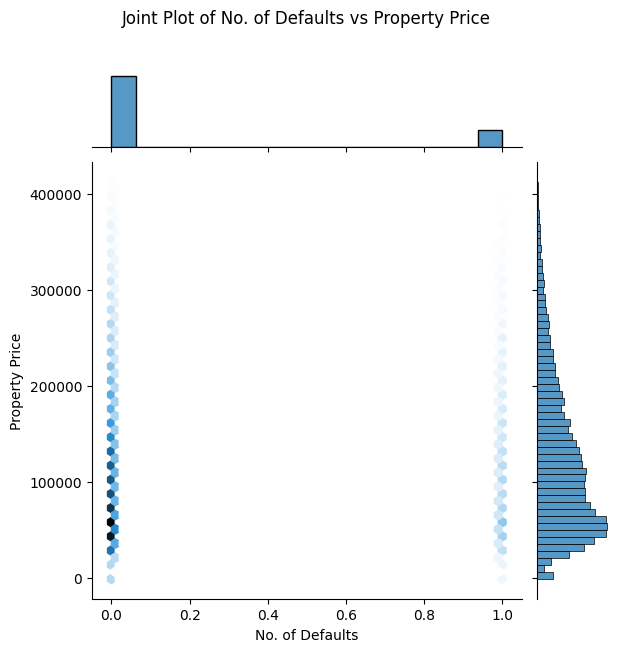

<Figure size 1000x500 with 0 Axes>

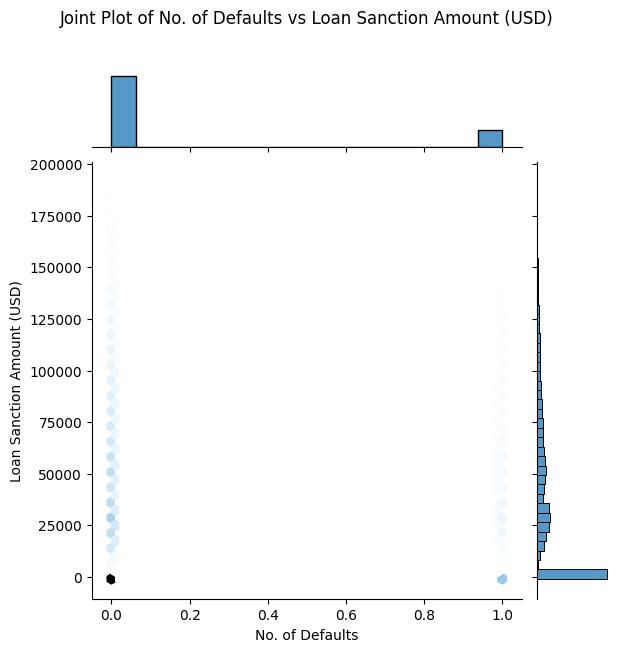

<Figure size 1000x500 with 0 Axes>

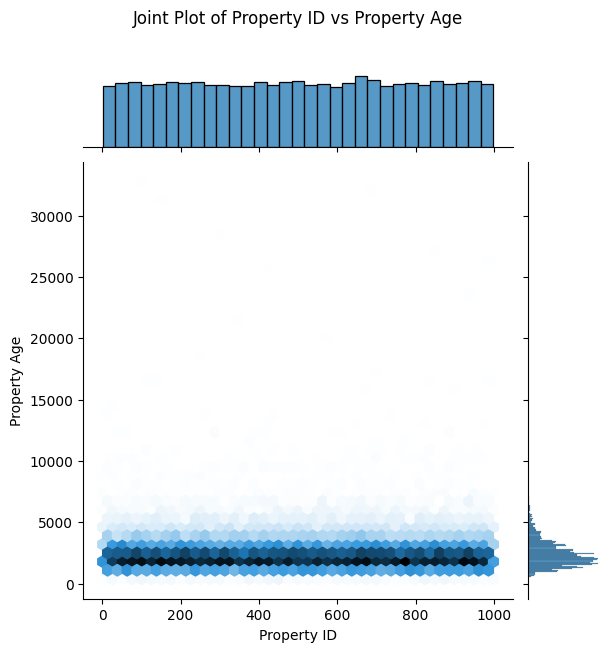

<Figure size 1000x500 with 0 Axes>

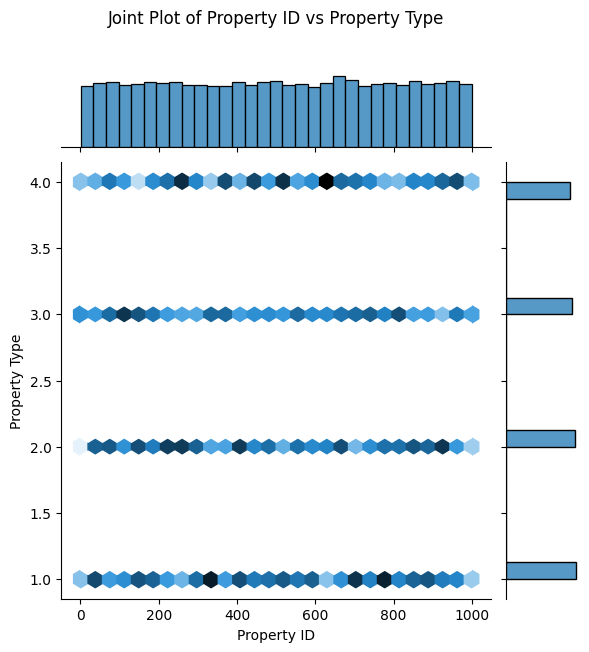

<Figure size 1000x500 with 0 Axes>

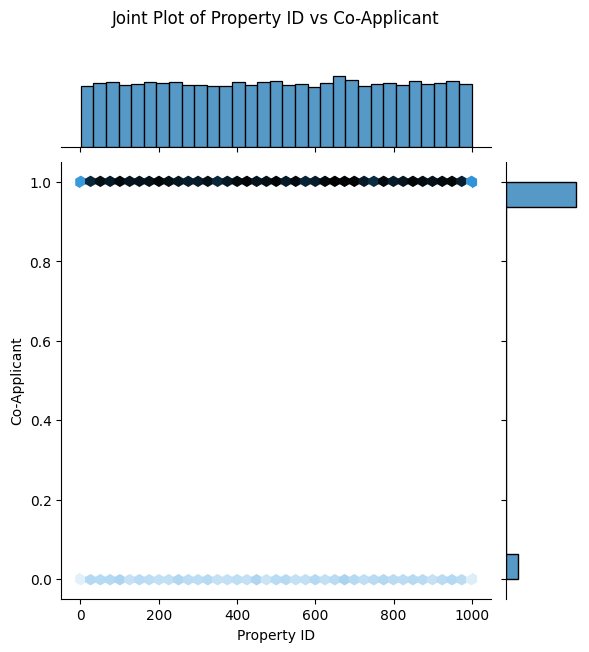

<Figure size 1000x500 with 0 Axes>

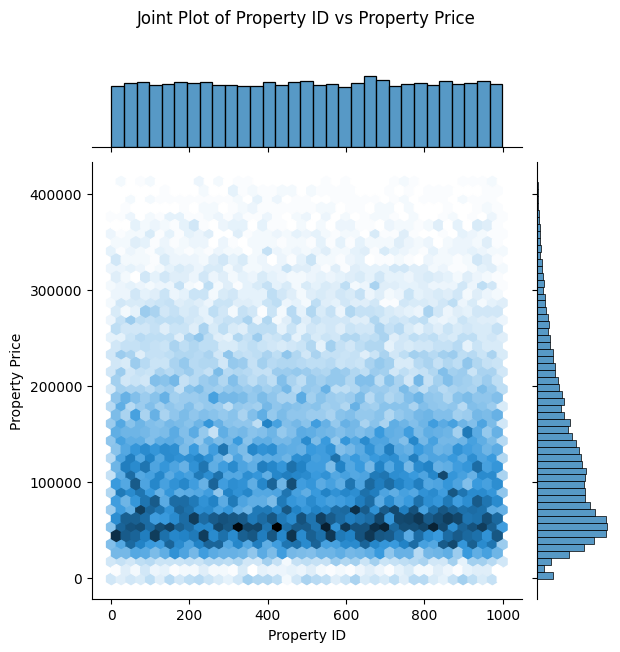

<Figure size 1000x500 with 0 Axes>

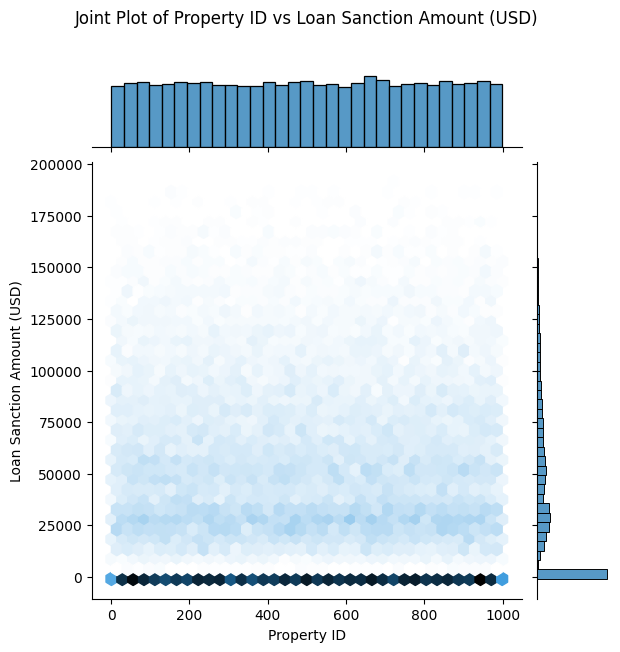

<Figure size 1000x500 with 0 Axes>

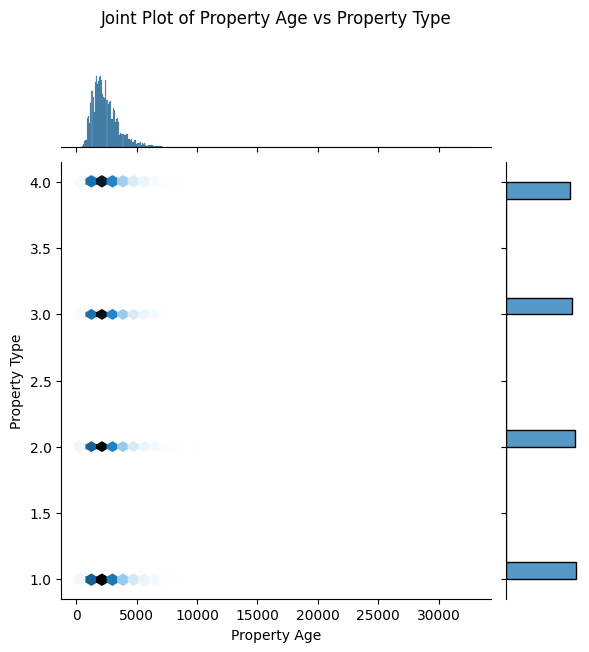

<Figure size 1000x500 with 0 Axes>

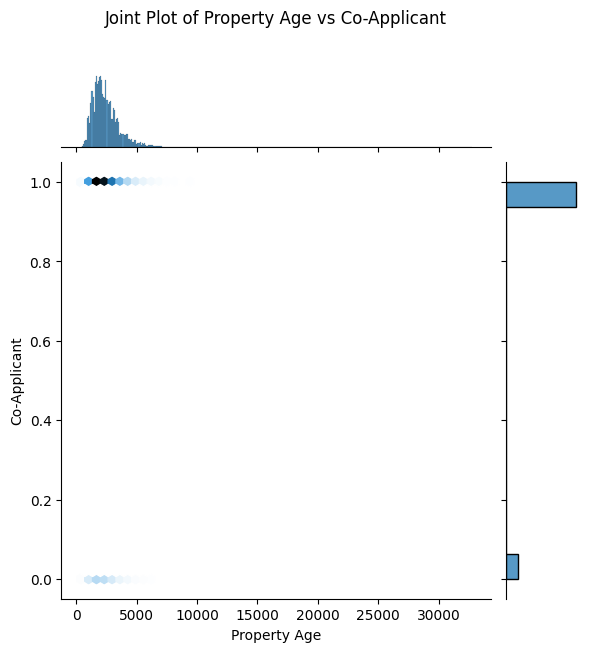

<Figure size 1000x500 with 0 Axes>

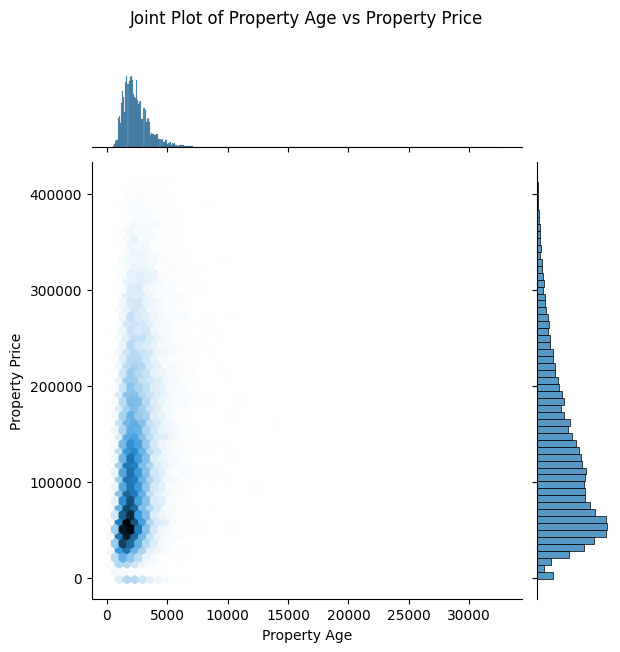

<Figure size 1000x500 with 0 Axes>

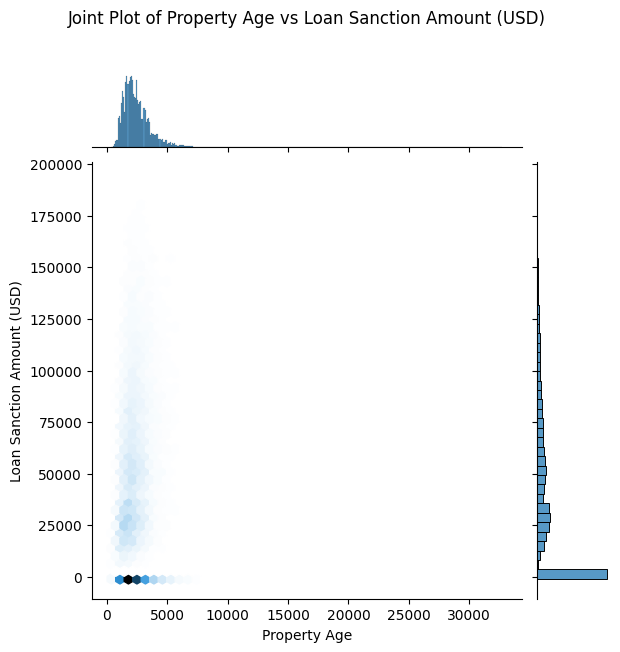

<Figure size 1000x500 with 0 Axes>

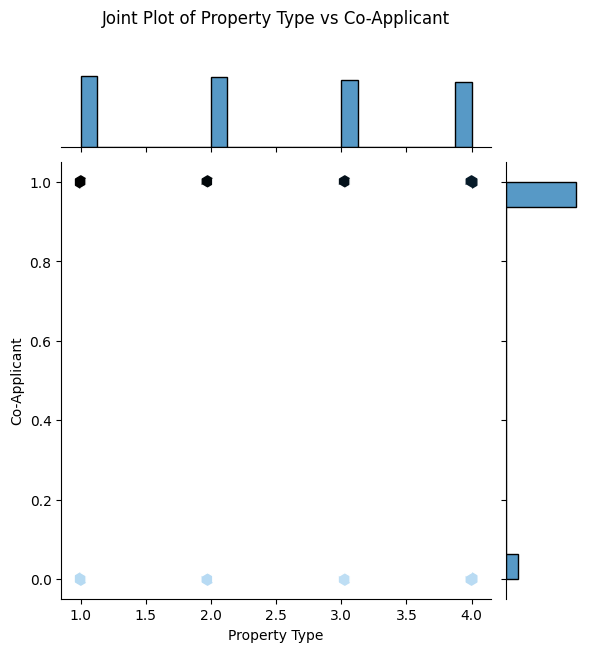

<Figure size 1000x500 with 0 Axes>

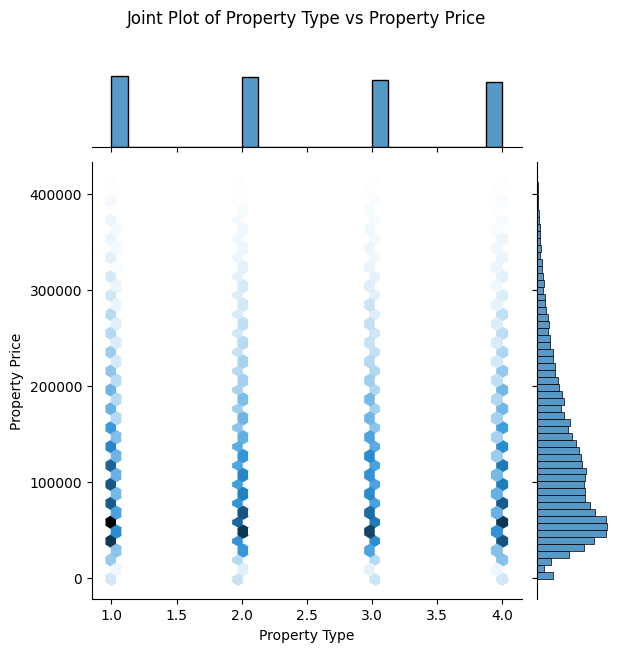

<Figure size 1000x500 with 0 Axes>

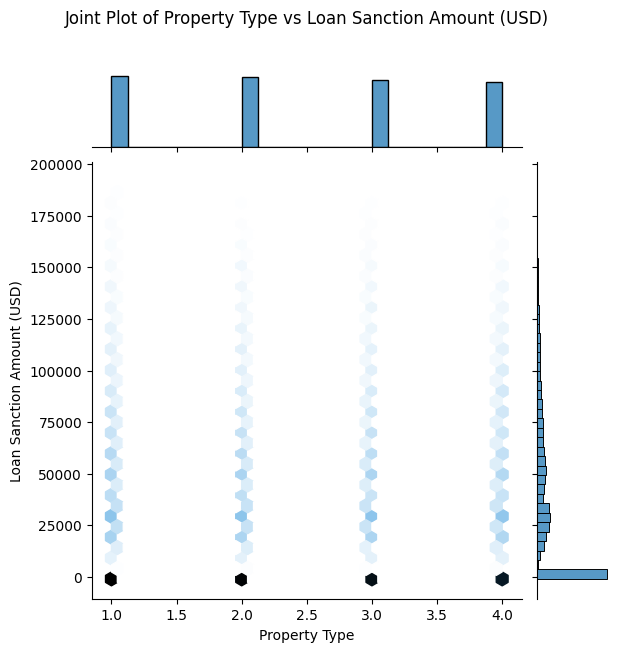

<Figure size 1000x500 with 0 Axes>

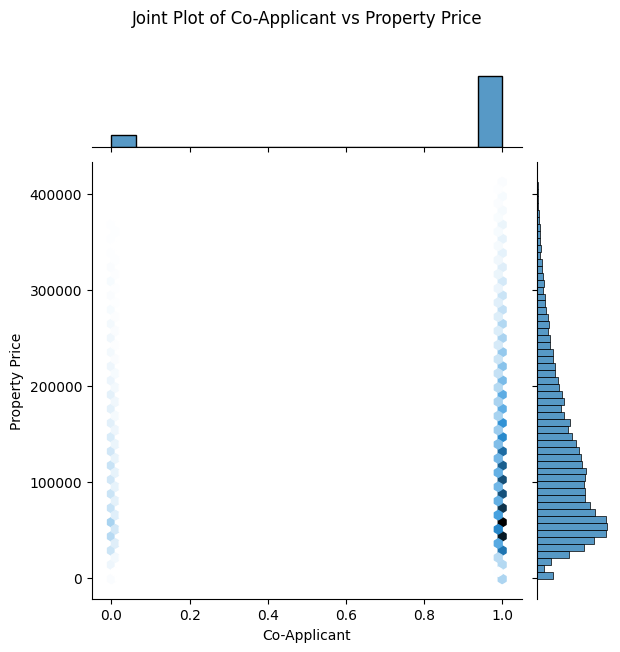

<Figure size 1000x500 with 0 Axes>

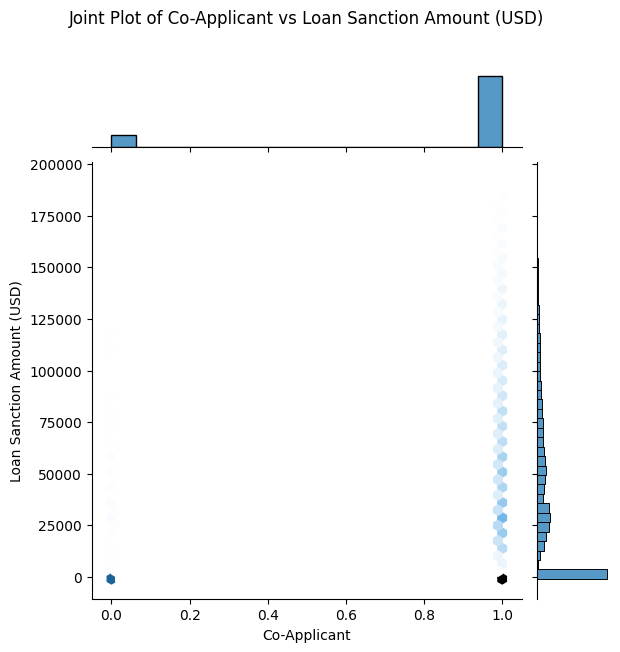

<Figure size 1000x500 with 0 Axes>

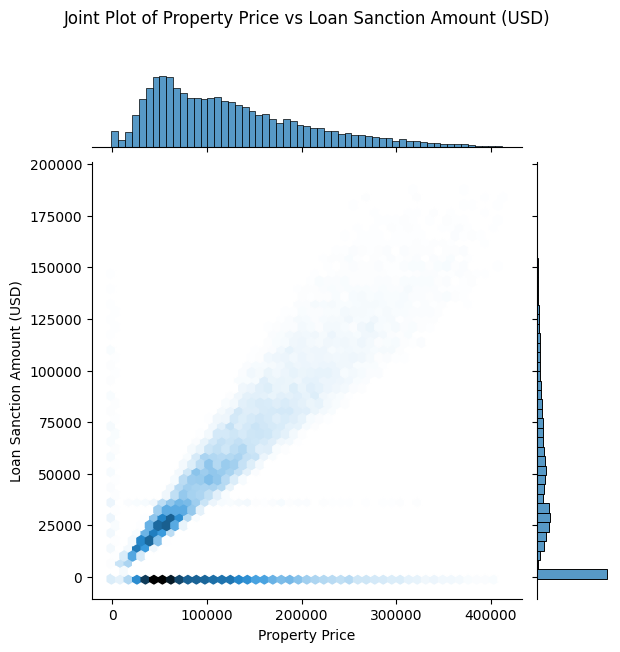

In [4]:
# Joint Plot
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        plt.figure(figsize=(10, 5))
        sns.jointplot(x=data[numerical_cols[i]], y=data[numerical_cols[j]], kind='hex')
        plt.title(f'Joint Plot of {numerical_cols[i]} vs {numerical_cols[j]}', pad=100)
        plt.xlabel(numerical_cols[i])
        plt.ylabel(numerical_cols[j])
        plt.show()


##### Heatmap with Clusters
###### A clustered heatmap provides a correlation matrix with hierarchical clustering.

<Figure size 1500x1000 with 0 Axes>

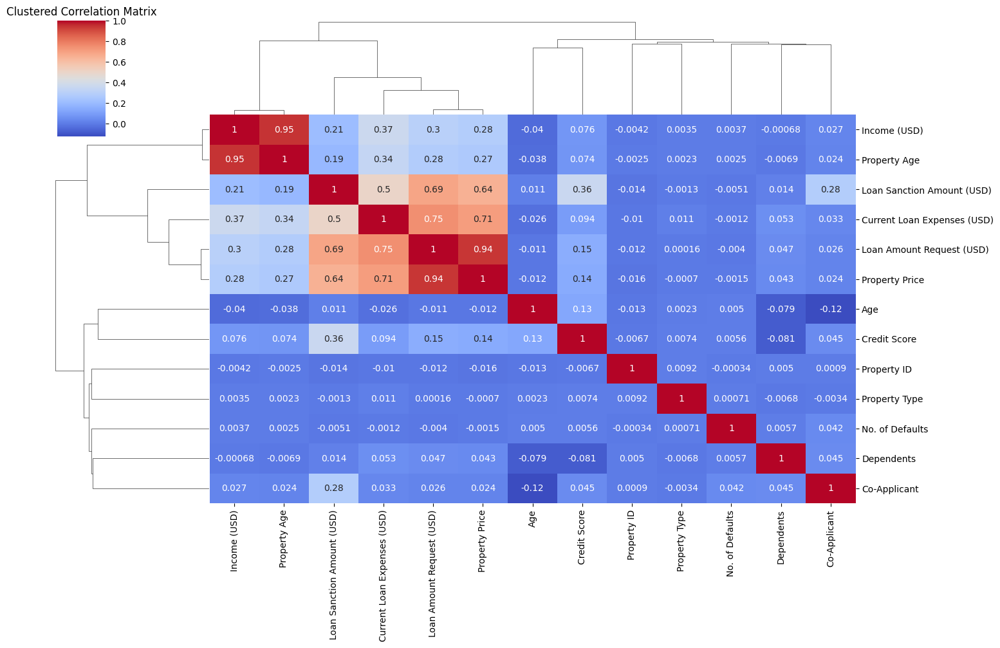

In [6]:
# Function to handle non-numeric columns for correlation
def get_numeric_data(df):
    return df.select_dtypes(include=['float64', 'int64'])
# Correlation heatmap with clusters
numeric_data = get_numeric_data(data)
plt.figure(figsize=(15, 10))
sns.clustermap(numeric_data.corr(), annot=True, cmap='coolwarm', figsize=(15, 10))
plt.title('Clustered Correlation Matrix')
plt.show()

### Multivariate Analysis

##### 3D Scatter Plot with Hue
###### A 3D scatter plot with color coding by a categorical variable provides a view of the relationship among three numerical variables and one categorical variable.

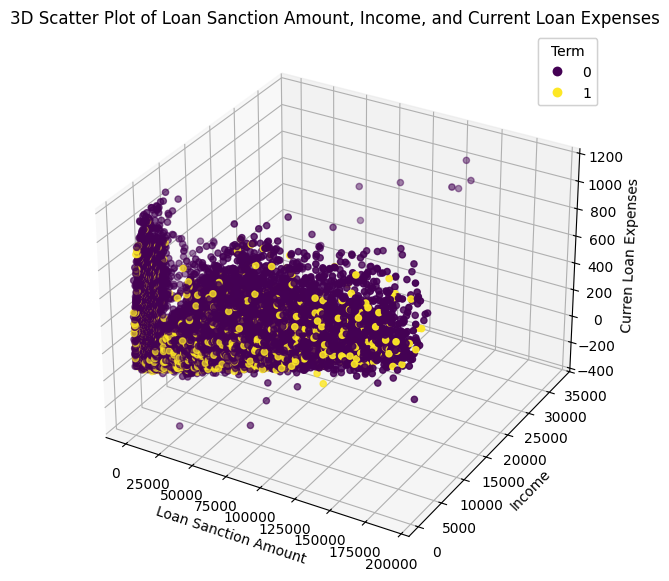

In [13]:
from mpl_toolkits.mplot3d import Axes3D

# 3D Scatter Plot with Hue
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

x = data['Loan Sanction Amount (USD)']  # Example numerical column
y = data['Income (USD)']  # Example numerical column
z = data['Current Loan Expenses (USD)']  # Example numerical column
hue = data['Income Stability']  # Example categorical column

scatter = ax.scatter(x, y, z, c=pd.factorize(hue)[0], cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), title="Term")
ax.add_artist(legend1)

ax.set_xlabel('Loan Sanction Amount')
ax.set_ylabel('Income')
ax.set_zlabel('Curren Loan Expenses')
plt.title('3D Scatter Plot of Loan Sanction Amount, Income, and Current Loan Expenses')
plt.show()


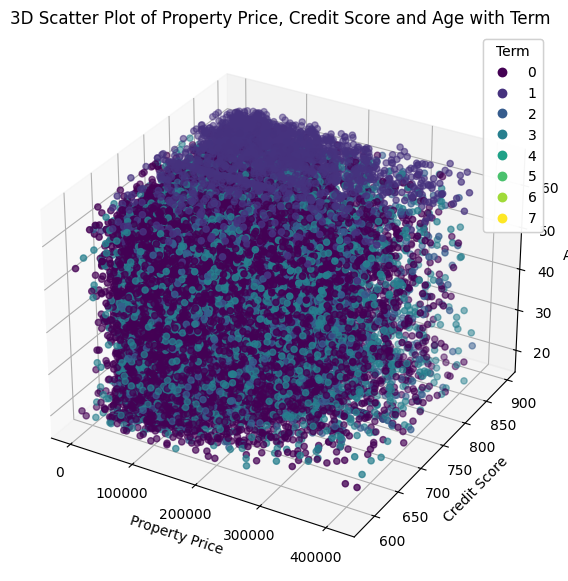

In [14]:
from mpl_toolkits.mplot3d import Axes3D

# 3D Scatter Plot with Hue
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

x = data['Property Price']  # Example numerical column
y = data['Credit Score']  # Example numerical column
z = data['Age']  # Example numerical column
hue = data['Profession']  # Example categorical column

scatter = ax.scatter(x, y, z, c=pd.factorize(hue)[0], cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), title="Term")
ax.add_artist(legend1)

ax.set_xlabel('Property Price')
ax.set_ylabel('Credit Score')
ax.set_zlabel('Age')
plt.title('3D Scatter Plot of Property Price, Credit Score and Age with Term')
plt.show()

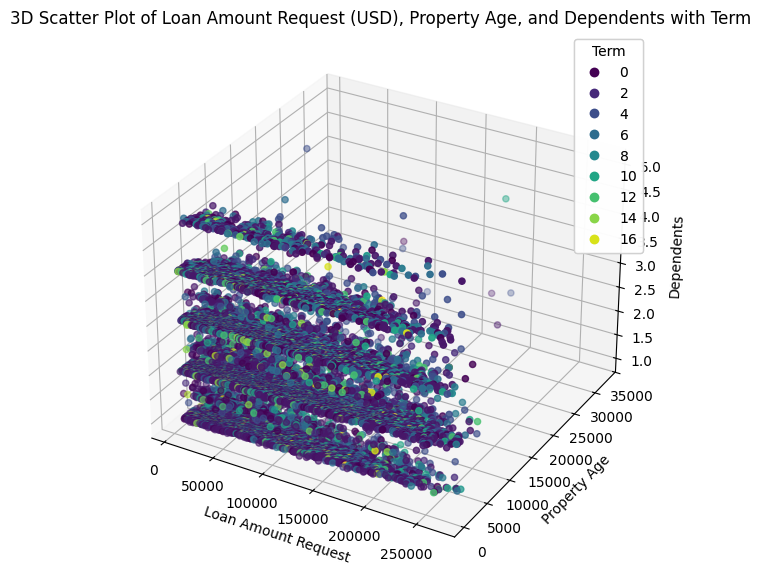

In [16]:
from mpl_toolkits.mplot3d import Axes3D

# 3D Scatter Plot with Hue
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

x = data['Loan Amount Request (USD)']  # Example numerical column
y = data['Property Age']  # Example numerical column
z = data['Dependents']  # Example numerical column
hue = data['Type of Employment']  # Example categorical column

scatter = ax.scatter(x, y, z, c=pd.factorize(hue)[0], cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), title="Term")
ax.add_artist(legend1)

ax.set_xlabel('Loan Amount Request')
ax.set_ylabel('Property Age')
ax.set_zlabel('Dependents')
plt.title('3D Scatter Plot of Loan Amount Request (USD), Property Age, and Dependents with Term')
plt.show()

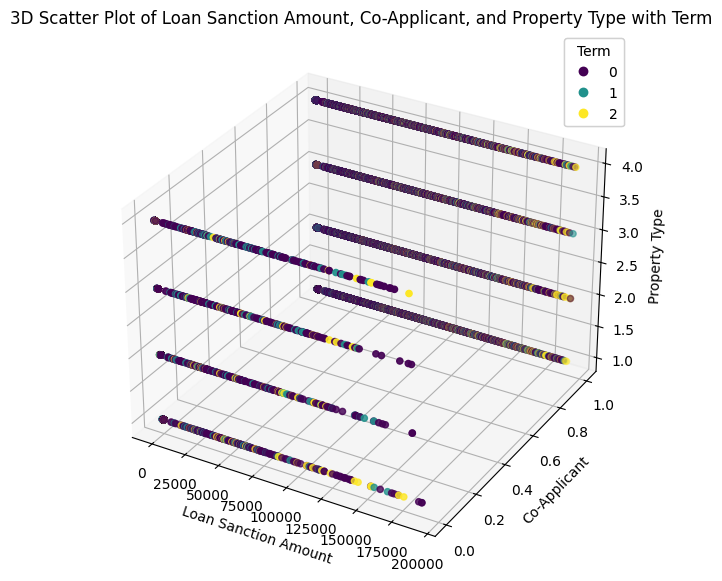

In [17]:
from mpl_toolkits.mplot3d import Axes3D

# 3D Scatter Plot with Hue
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

x = data['Loan Sanction Amount (USD)']  # Example numerical column
y = data['Co-Applicant']  # Example numerical column
z = data['Property Type']  # Example numerical column
hue = data['Location']  # Example categorical column

scatter = ax.scatter(x, y, z, c=pd.factorize(hue)[0], cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), title="Term")
ax.add_artist(legend1)

ax.set_xlabel('Loan Sanction Amount')
ax.set_ylabel('Co-Applicant')
ax.set_zlabel('Property Type')
plt.title('3D Scatter Plot of Loan Sanction Amount, Co-Applicant, and Property Type with Term')
plt.show()

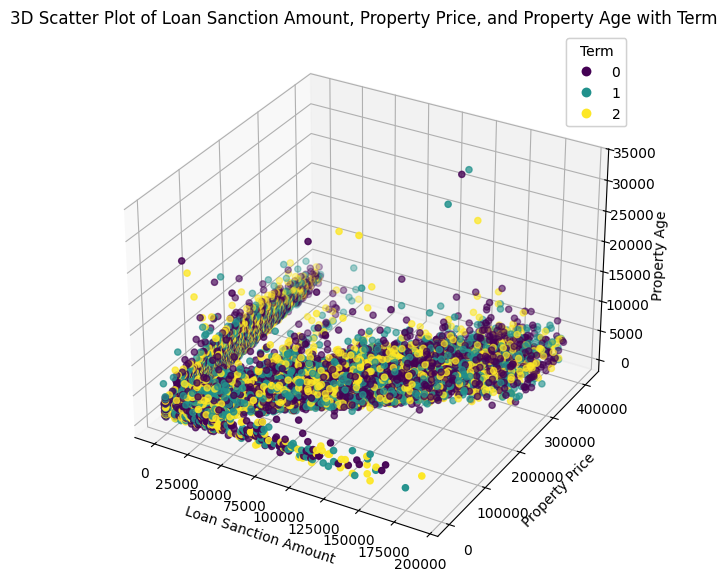

In [18]:
from mpl_toolkits.mplot3d import Axes3D

# 3D Scatter Plot with Hue
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

x = data['Loan Sanction Amount (USD)']  # Example numerical column
y = data['Property Price']  # Example numerical column
z = data['Property Age']  # Example numerical column
hue = data['Has Active Credit Card']  # Example categorical column

scatter = ax.scatter(x, y, z, c=pd.factorize(hue)[0], cmap='viridis')
legend1 = ax.legend(*scatter.legend_elements(), title="Term")
ax.add_artist(legend1)

ax.set_xlabel('Loan Sanction Amount')
ax.set_ylabel('Property Price')
ax.set_zlabel('Property Age')
plt.title('3D Scatter Plot of Loan Sanction Amount, Property Price, and Property Age with Term')
plt.show()